In [ ]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "4"
import torch
import cv2
import pandas as pd
import numpy as np
from tqdm.auto import tqdm, trange
from pprint import pprint
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
data_folder = "/data/karpenko/XRay_PTD_IMAGE_TEXT_DATASET_SUBSET_46K_ENHANCED_TRANSLATION"

dfs = dict()
for split in ['train', 'val', 'test']:
    dfs[split] = pd.read_csv(os.path.join(data_folder, f'{split}/opisanie_{split}.csv'))

dfs['train'].head()

,Unnamed: 0,pngfilepath,opisanie_eng
0,0,48423_3_61481.dcm_norm.png,Pulmonary fibrosis. Pulmonary emphysema. Aorti...
1,1,537290_1_8399.dcm_norm.png,Fibrotic changes in the perihilar zone on the ...
2,2,24520_3_101465.dcm_norm.png,Pulmonary fibrosis. Widened vascular pulmonary...
3,3,480192_1_150969.dcm_norm.png,The pulmonary hila are wide and display linear...
4,4,52783_5_149204.dcm_norm.png,Infiltration in the upper lobe on the left. Pr...


In [ ]:
dfs['train'].shape, dfs['val'].shape, dfs['test'].shape

((37279, 3), (4660, 3), (4660, 3))

<class 'numpy.ndarray'>
(512, 512, 3)


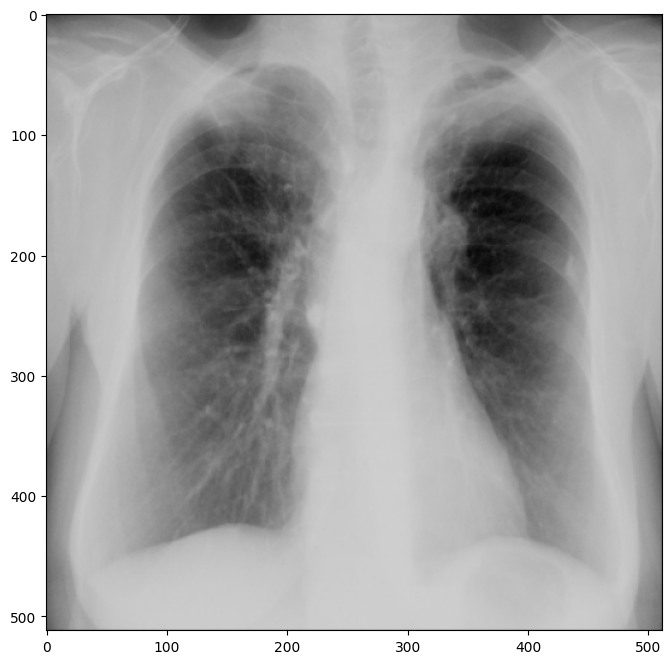

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
image = cv2.imread(os.path.join(data_folder, 'train/img', dfs['train']['pngfilepath'][0]))
print(type(image))
print(image.shape)
plt.imshow(image)
plt.show()

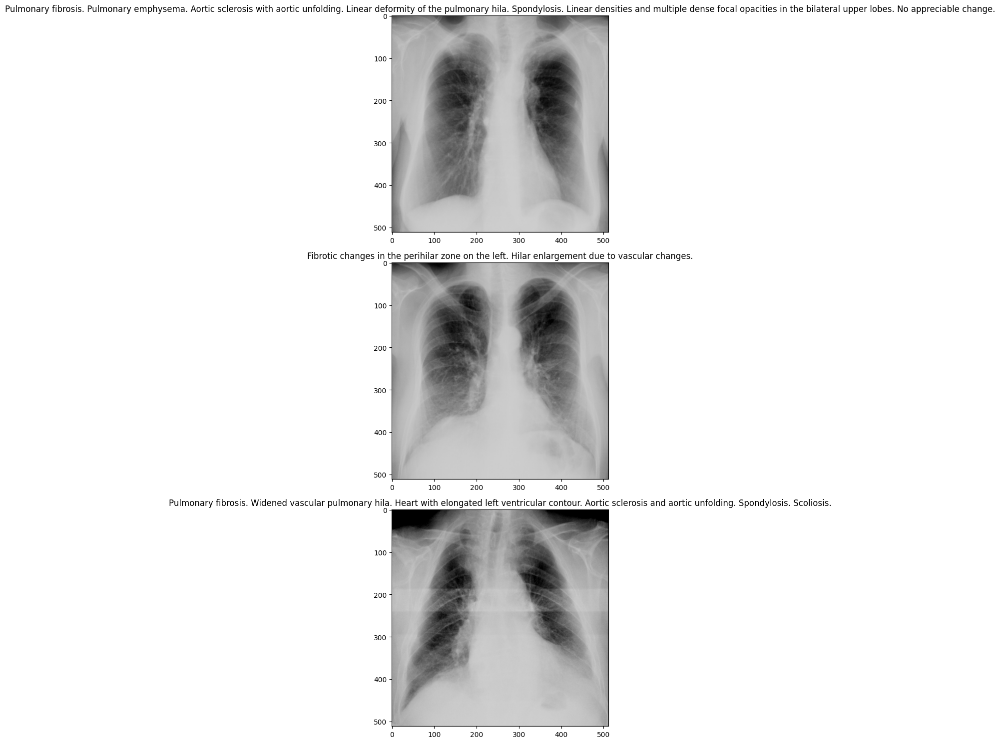

In [ ]:
inds = list(range(3))
split = 'train'

h, w = 3, 1
title_width = 43

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['pngfilepath']
    caption = row['opisanie_eng']
    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(cv2.imread(os.path.join(data_folder, f'{split}/img', img_id)))

fig.tight_layout()
plt.show()

### 1.2 Предобработка изображений

In [ ]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as tr

In [ ]:
from torchvision import models

weights = models.ResNet18_Weights.DEFAULT
weights.transforms()

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

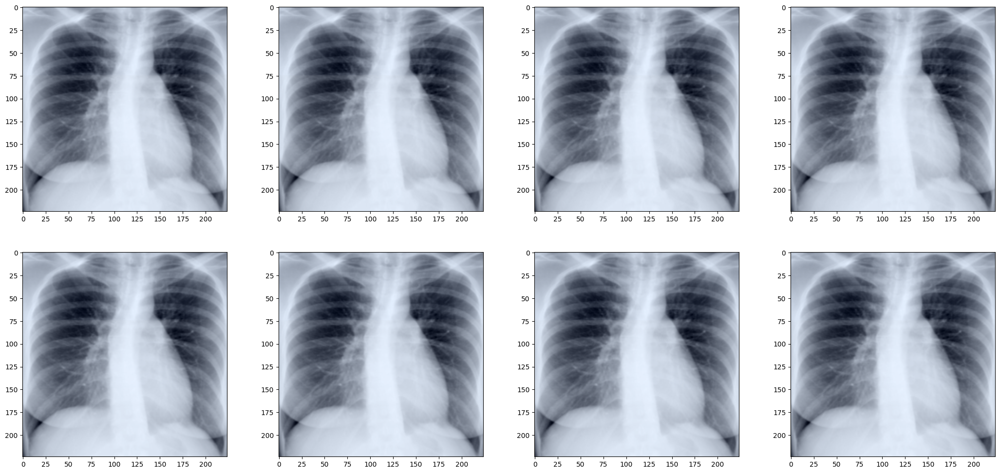

In [ ]:
channel_mean = np.array([0.485, 0.456, 0.406])
channel_std = np.array([0.229, 0.224, 0.225])
#channel_mean = np.array([0.5, 0.5, 0.5])
#channel_std = np.array([0.5, 0.5, 0.5])

# https://docs.pytorch.org/vision/main/models/generated/torchvision.models.resnet18.html?highlight=models+resnet18_weights+default#torchvision.models.ResNet18_Weights
# смотрел тут описание в какой последовательности что делалось, в ячейке выше видны параметры transform-ов для этой модели.
image_prepare = tr.Compose([
    tr.ToPILImage(),
    tr.Resize((256, 256)), # по дефолту билинейная
    tr.CenterCrop(224),
    tr.ToTensor(),
    tr.Normalize(mean=channel_mean, std=channel_std),
])

image_prepare_val = tr.Compose([
    tr.ToPILImage(),
    tr.Resize((256, 256)),
    tr.CenterCrop(224),
    tr.ToTensor(),
    tr.Normalize(mean=channel_mean, std=channel_std),
])


from sklearn.preprocessing import minmax_scale

image = cv2.imread(os.path.join(data_folder, "train/img", dfs['train']['pngfilepath'][10]))

def de_normalize(img):
    return minmax_scale(
        (img.reshape(3, -1) + channel_mean[:, None]) * channel_std[:, None],
        feature_range=(0., 1.),
        axis=1,
    ).reshape(*img.shape)

# Проверка на адекватность
fig, ax = plt.subplots(2, 4, figsize=(26, 12))
for i in range(8):
    plt.subplot(2, 4, i+1)
    transformed_image = image_prepare(image).numpy().transpose(1, 2, 0)
    to_show_image = de_normalize(transformed_image)
    plt.imshow(to_show_image)
plt.show()

### 1.3 Предобработка заголовков

Для простоты вычислений предлагаю сделать крайне простую токенизацию, пользуясь регулярными выражениями и библиотекой **re**

1. Приводим текст к нижнему регистру
2. Заменяем всю пунктуацию на пробелы
3. Убираем пробельные символы с концов строки
4. Разбиваем по ненулевой последовательности пробельных символов
5. Добавляем специальные токены \<BOS> (begining of sentence) и \<EOS> (end of sentence), чтобы обозначить границы заголовка для модели

In [ ]:
import re

def tokenize(text):
    text = text.lower()
    #text = re.sub(r'[^\w\s]', ' ', text)
    #text = text.strip()
    #tokens = re.split(r'\s+', text)
    tokens = re.findall(r'\w+|[^\w\s]', text)
    tokens = ['<BOS>'] + tokens + ['<EOS>']
    return tokens

tokenize("My name is Any0019, I wish you good luck in this lab! Bye-bye :)")

['<BOS>',
 'my',
 'name',
 'is',
 'any0019',
 ',',
 'i',
 'wish',
 'you',
 'good',
 'luck',
 'in',
 'this',
 'lab',
 '!',
 'bye',
 '-',
 'bye',
 ':',
 ')',
 '<EOS>']

Соберём словарь из всех слов, что встречаются в заголовках в train
1. Токенизируем заголовки
2. Обновляем частоту всех отдельных токенов
3. Выкидываем все слова встретившиеся меньше `MIN_FREQ` (допустим 3 - можете взять другое число) -> заменяем на специальный `<UNK>` (unknown) токен
4. Записываем быстрое преобразование из токенов в индексы и наоборот

  0%|          | 0/37279 [00:00<?, ?it/s]

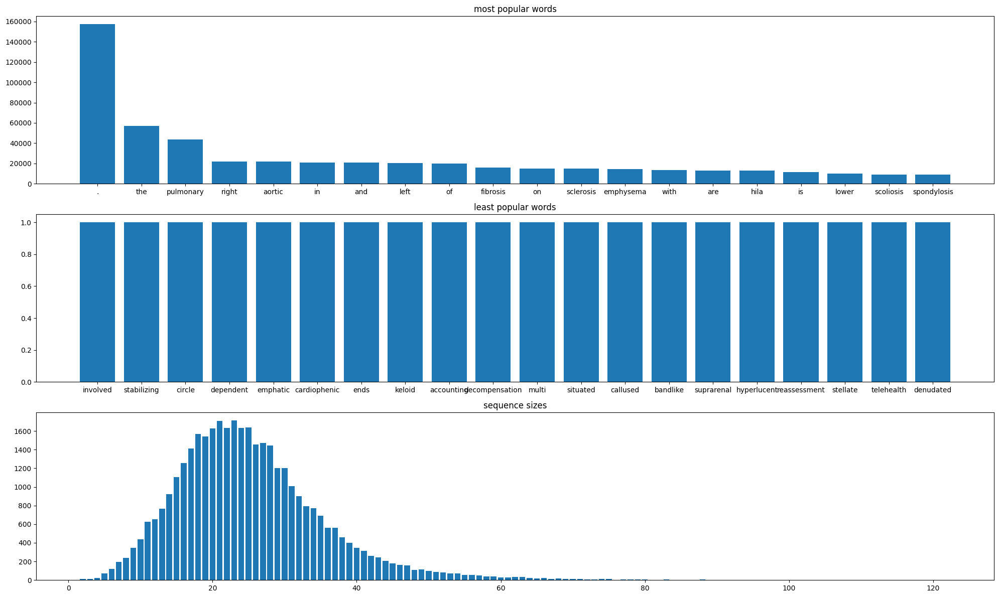

In [ ]:
from tqdm.auto import trange
from collections import Counter

# Посчитаем частоту встречаемости различных токенов (не нужно для bos и eos)
vocab_freq = Counter()

# Параллельно заодно посчитаем длины заголовков в токенах (сколько раз встречалась какая длина в токенах)
sizes = Counter()
for i in trange(len(dfs['train'])):
    row = dfs['train'].iloc[i]
    caption = row.iloc[2]
    tokens = tokenize(caption)[1:-1]
    vocab_freq.update(tokens)
    sizes[len(tokens)] += 1

global_max_seq_len = np.max(list(sizes.keys()))

show_ = 20
fig, ax = plt.subplots(3, 1, figsize=(20, 12))

plt.subplot(312)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1])}
plt.title('least popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(311)
vocab_freq = {k: v for k, v in sorted(vocab_freq.items(), key=lambda item: item[1], reverse=True)}
plt.title('most popular words')
plt.bar(list(vocab_freq.keys())[:show_], list(vocab_freq.values())[:show_])

plt.subplot(313)
plt.title('sequence sizes')
plt.bar(list(sizes.keys()), list(sizes.values()))

fig.tight_layout()
plt.show()

In [ ]:
MIN_FREQ = 0  # токены с частотой ниже этой константы заменяются на <UNK>

# Так же добавляем <PAD> токен для паддингов
tok_to_ind = {
    '<UNK>': 0,
    '<BOS>': 1,
    '<EOS>': 2,
    '<PAD>': 3,
}

ind_to_tok = {
    0: '<UNK>',
    1: '<BOS>',
    2: '<EOS>',
    3: '<PAD>',
}

# Заполнить оставшееся
ind = 4
for tok, freq in vocab_freq.items():
    if freq >= MIN_FREQ:
        tok_to_ind[tok] = ind
        ind_to_tok[ind] = tok
        ind += 1

assert len(tok_to_ind) == len(ind_to_tok)
vocab_size = len(tok_to_ind)
print(f"Resulting vocab size: {vocab_size} (out of {len(vocab_freq)} tokens overall, due to MIN_FREQ={MIN_FREQ})")

Resulting vocab size: 2190 (out of 2186 tokens overall, due to MIN_FREQ=0)


In [ ]:
# Функция возвращает по тексту индексы токенов в тексте
def to_ids(text):
    ids = []
    toks = tokenize(text)
    for tok in toks:
        if tok in tok_to_ind:
            ids.append(tok_to_ind[tok])
        else:
            ids.append(tok_to_ind['<UNK>'])
    return ids

text = "Pulmonary fibrosis. Pulmonary emphysema. Aortic sclerosis with aortic unfolding."
toks = tokenize(text)
ids = to_ids(text)

print(list(zip(toks, ids)))

assert toks[0] == '<BOS>' and toks[-1] == '<EOS>'
assert ids[0] == tok_to_ind['<BOS>'] and ids[-1] == tok_to_ind['<EOS>']

[('<BOS>', 1), ('pulmonary', 6), ('fibrosis', 13), ('.', 4), ('pulmonary', 6), ('emphysema', 16), ('.', 4), ('aortic', 8), ('sclerosis', 15), ('with', 17), ('aortic', 8), ('unfolding', 51), ('.', 4), ('<EOS>', 2)]


### 1.4 Датасет

**Сделаем класс датасета в стиле torch.utils.data.Dataset**

In [ ]:
class ImageCaptioningDataset(Dataset):
    """
        imgs_path ~ путь к папке с изображениями
        captions_path ~ путь к .csv файлу с заголовками изображений
    """
    def __init__(self, imgs_path, captions_path, train=True):
        super(ImageCaptioningDataset).__init__()
        # Читаем и записываем из файлов в память класса, чтобы быстро обращаться внутри датасета
        # Если не хватает памяти на хранение всех изображений, то подгружайте прямо во время __getitem__, но это замедлит обучение
        # Проведите всю предобработку, которую можно провести без потери вариативности датасета, здесь
        self.imgs_path = imgs_path
        self.df = pd.read_csv(captions_path)
        self.train = train
        self.transform = image_prepare if train else image_prepare_val
        self.captions = []
        for i in range(len(self.df)):
            row = self.df.iloc[i]
            caption = to_ids(row['opisanie_eng'])
            self.captions.append(caption)

    def __getitem__(self, index):
        # Получаем предобработанное изображение
        img_path = os.path.join(self.imgs_path, self.df.iloc[index]['pngfilepath'])
        img = cv2.imread(img_path)
        img = self.transform(img)

        captions = self.captions[index]

        return img, captions

    def __len__(self):
        return len(self.df)

In [ ]:
ds_train = ImageCaptioningDataset(
    os.path.join(data_folder, 'train/img'),
    os.path.join(data_folder, f'train/opisanie_train.csv'),
    train=True,
)

ds_val = ImageCaptioningDataset(
    os.path.join(data_folder, 'val/img'),
    os.path.join(data_folder, f'val/opisanie_val.csv'),
    train=False,
)

In [ ]:
img1, caption1 = ds_train[10]
img2, caption2 = ds_train[1]

# Изображения должны быть тензорами (желательно одного размера для удобства складывания в батч)
assert isinstance(img1, torch.Tensor)
assert isinstance(img2, torch.Tensor)
assert img1.shape == img2.shape
assert img1.shape[0] == 3
print(f"Размер изображения из датасета: {img1.shape}")


assert isinstance(caption1[0], int)
assert ind_to_tok[caption1[0]] == "<BOS>"
assert ind_to_tok[caption1[-1]] == "<EOS>"

# Проверка что число элементов в датасете совпадает с соответствующим числом изображений
assert len(ds_train) == len(os.listdir(os.path.join(data_folder, 'train/img')))
assert len(ds_val) == len(os.listdir(os.path.join(data_folder, 'val/img')))

Размер изображения из датасета: torch.Size([3, 224, 224])


In [ ]:
caption1

[1, 22, 12, 5, 103, 120, 4, 58, 132, 135, 140, 4, 2]

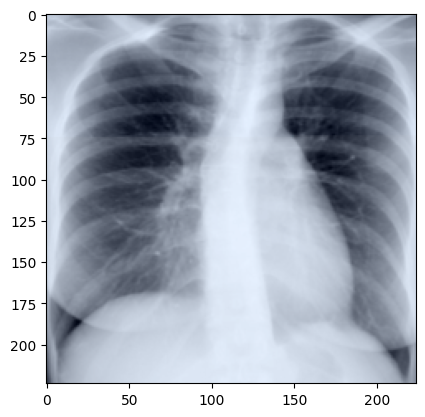

In [ ]:
# Проверка на адекватность
plt.imshow(
    de_normalize(img1.numpy().transpose(1, 2, 0))
)
plt.show()

### 1.5 Даталоадер

In [ ]:
def collate_fn(batch):
    images = []
    captions = []
    caption_max_len = 0
    for img, caption in batch:
        images.append(img)
        captions.append(caption)
        caption_max_len = max(caption_max_len, len(caption))

    img_batch = torch.stack(images, dim=0)
    captions_batch = []
    def pad(seq, size):
        while len(seq) < size:
            seq.append(tok_to_ind['<PAD>'])
        return seq

    for caption in captions:
        captions_batch.append(torch.tensor(pad(caption, caption_max_len)))
    captions_batch = torch.stack(captions_batch, dim=0)
    return img_batch, captions_batch

In [ ]:
batch_size = 512
num_workers = 4

dataloader_train = DataLoader(
    dataset=ds_train,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=True,
    drop_last=True,
    num_workers=num_workers,
)

dataloader_val = DataLoader(
    dataset=ds_val,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers,
)

In [ ]:
img_batch, captions_batch = next(iter(dataloader_train))

assert isinstance(img_batch, torch.Tensor)
assert isinstance(captions_batch, torch.Tensor)

assert img_batch.shape[:2] == torch.Size([batch_size, 3])
assert captions_batch.shape[0] == batch_size
assert len(captions_batch.shape) in [2, 3]

assert isinstance(captions_batch.reshape(-1)[0].item(), int)

print("Размер батча изображений: {}\nРазмер батча заголовков: {}".format(img_batch.shape, captions_batch.shape))

Размер батча изображений: torch.Size([512, 3, 224, 224])
Размер батча заголовков: torch.Size([512, 85])


## 2. Составляем и обучаем модель

### 2.1 Фича-экстрактор для изображений

In [ ]:
from torchvision import models
from torch import nn

In [ ]:
class img_fe_class(nn.Module):
    def __init__(self):
        super(img_fe_class, self).__init__()
        weights = models.ResNet18_Weights.DEFAULT
        self.fe_extractor = models.resnet18(weights=weights)

        for param in self.fe_extractor.parameters():
            param.requires_grad = False
        self.fe_extractor.fc = nn.Identity()

    def forward(self, imgs):
        return self.fe_extractor(imgs)

In [ ]:
img_fe = img_fe_class()

img_features = img_fe(img_batch)

assert len(img_features.shape) == 2
assert img_features.shape[0] == img_batch.shape[0]

print(f'Для изображения возвращает {img_features.shape[1]} фичей')

Для изображения возвращает 512 фичей


### 2.2 Фича-экстрактор для текста

Давайте скачаем предобученные glove вектора и инициализируем nn.Embedding ими, там где мы их знаем

In [ ]:
##!:bash
#!wget -O glove.zip https://huggingface.co/stanfordnlp/glove/resolve/main/glove.840B.300d.zip
## mirror https://nlp.stanford.edu/data/wordvecs/glove.840B.300d.zip

#!unzip glove.zip

#!ls -sh glove.*

In [ ]:
# Открываем glove
np.random.seed(19)

def load_glove_weights(file_path, vocab, pad_token="<PAD>"):
    print("Loading Glove Weights")
    # Инициализируем веса для всех слов стандартным нормальным распределением
    glove_weights = np.random.uniform(0, 1, (len(vocab), 300))
    mask_found = np.zeros(len(vocab), dtype=bool)

    # Ищем среди слов в предобученном glove слова из нашего словаря
    with open(file_path, 'r') as f:
        for line in tqdm(f, total=2196018):
            line = line.split()
            token = ' '.join(line[:-300])
            embed = line[-300:]

            # Если нашли, то подменяем эмбеддинг из glove
            if token in vocab:
                ind = vocab[token]
                mask_found[ind] = True
                glove_weights[ind, :] = np.array(list(map(float, embed)), dtype=np.float64)

    print(f"{mask_found.sum()} words from vocab of size {len(vocab)} loaded!")

    glove_weights[vocab[pad_token]] = np.zeros(300, dtype=np.float64)
    return glove_weights, mask_found


glove_path = "glove.840B.300d.txt"
glove_weights, mask_found = load_glove_weights(glove_path, tok_to_ind, "<PAD>")

Loading Glove Weights


  0%|          | 0/2196018 [00:00<?, ?it/s]

1959 words from vocab of size 2190 loaded!


In [ ]:
from einops import rearrange

class text_fe_class(nn.Module):
    def __init__(self, vocab_size, embedding_dim=300, hidden_size=512, num_layers=3):
        super(text_fe_class, self).__init__()

        self.embed = nn.Embedding(num_embeddings=vocab_size, embedding_dim=embedding_dim, padding_idx=tok_to_ind['<PAD>'])
        self.embed.weight = nn.Parameter(
            torch.from_numpy(glove_weights).to(dtype=self.embed.weight.dtype),
            requires_grad=True,
        )

        self.num_layers = num_layers
        self.hidden_size = hidden_size

        self.lstm = nn.LSTM(embedding_dim, hidden_size, num_layers, batch_first=True)
        self.img_to_hidden = nn.Linear(512, num_layers * hidden_size)
        self.img_to_cell = nn.Linear(512, num_layers * hidden_size)

    def forward(self, texts, img_features):
        batch_size, seq_len = texts.shape

        texts_flat = texts # rearrange(texts, 'bs cap seq -> (bs cap) seq')
        embeds = self.embed(texts_flat)

        img_features_expanded = img_features # img_features.repeat_interleave(num_captions, dim=0)

        h0_combined = self.img_to_hidden(img_features_expanded)
        c0_combined = self.img_to_cell(img_features_expanded)

        h0 = h0_combined.view(-1, self.num_layers, self.hidden_size).transpose(0, 1).contiguous()
        c0 = c0_combined.view(-1, self.num_layers, self.hidden_size).transpose(0, 1).contiguous()

        lstm_out, _ = self.lstm(embeds, (h0, c0))

        features = lstm_out # rearrange(lstm_out, '(bs cap) seq emb -> bs cap seq emb', bs=batch_size, cap=num_captions)
        return features

In [ ]:
text_fe = text_fe_class(vocab_size)
text_features = text_fe(captions_batch, img_features)

assert text_features.shape[:-1] == captions_batch.shape
assert len(text_features.shape) in [3, 4]
assert len(text_features.shape) == len(captions_batch.shape) + 1

print(captions_batch.shape)
print(img_features.shape)
print(text_features.shape)

torch.Size([512, 85])
torch.Size([512, 512])
torch.Size([512, 85, 512])


### 2.3 Финальная модель

In [ ]:
from collections import OrderedDict

class image_captioning_model(nn.Module):
    def __init__(self, img_fe, text_fe, vocab_size, hidden_size=512):
        super(image_captioning_model, self).__init__()
        self.img_fe = img_fe
        self.text_fe = text_fe
        self.classifier = nn.Linear(hidden_size, vocab_size)

    def forward(self, img_batch, texts_batch):
        img_features = self.img_fe(img_batch)
        text_features = self.text_fe(texts_batch, img_features)
        logits = self.classifier(text_features)

        return logits

In [ ]:
model = image_captioning_model(img_fe, text_fe, vocab_size)

res = model(img_batch, captions_batch)

assert res.shape[:-1] == captions_batch.shape
assert res.shape[-1] == vocab_size

print(res.shape)

torch.Size([512, 85, 2190])


In [ ]:
from termcolor import colored
from collections import defaultdict

def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))

# Считаем общее число параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = np.prod(param.shape)
        if verbose_all or (verbose_only_learnable and param[1].requires_grad):
            print(
                colored(
                    '{: <42} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param[1].requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )

    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params


sum_params, sum_learnable_params = model_num_params(model)

img_fe.fe_extractor.conv1.weight           ~  9.408     params ~ grad: False
img_fe.fe_extractor.bn1.weight             ~  64        params ~ grad: False
img_fe.fe_extractor.bn1.bias               ~  64        params ~ grad: False
img_fe.fe_extractor.layer1.0.conv1.weight  ~  36.864    params ~ grad: False
img_fe.fe_extractor.layer1.0.bn1.weight    ~  64        params ~ grad: False
img_fe.fe_extractor.layer1.0.bn1.bias      ~  64        params ~ grad: False
img_fe.fe_extractor.layer1.0.conv2.weight  ~  36.864    params ~ grad: False
img_fe.fe_extractor.layer1.0.bn2.weight    ~  64        params ~ grad: False
img_fe.fe_extractor.layer1.0.bn2.bias      ~  64        params ~ grad: False
img_fe.fe_extractor.layer1.1.conv1.weight  ~  36.864    params ~ grad: False
img_fe.fe_extractor.layer1.1.bn1.weight    ~  64        params ~ grad: False
img_fe.fe_extractor.layer1.1.bn1.bias      ~  64        params ~ grad: False
img_fe.fe_extractor.layer1.1.conv2.weight  ~  36.864    params ~ grad: False

### 2.4 Оптимайзер

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def create_model_and_optimizer(model_class, model_params, lr=3e-4, device=device):
    model = model_class(**model_params)
    model = model.to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    return model, optimizer

params = {
    'img_fe': img_fe,
    'text_fe': text_fe,
    'vocab_size': vocab_size,
    'hidden_size': 512
}

model, optimizer = create_model_and_optimizer(
    image_captioning_model, params
)

### 2.5 Один шаг обучения/валидации

captions мы используем и как input (`captions[..., seq->0:-1, ...]`) в модель и как target (`captions[..., seq->1:None, ...]`)

In [ ]:
from collections import defaultdict

def train(model, opt, loader, criterion):
    model.train()
    losses_tr = []
    for img_batch, captions_batch in tqdm(loader):
        img_batch = img_batch.to(device)
        captions_batch = captions_batch.to(device)

        opt.zero_grad()

        input = captions_batch[..., :-1]
        pred = model(img_batch, input)
        target = captions_batch[..., 1:]
        loss = criterion(rearrange(pred, 'bs seq emb -> (bs seq) emb'), rearrange(target, 'bs seq -> (bs seq)'))

        loss.backward()
        opt.step()
        losses_tr.append(loss.item())

    return model, opt, np.mean(losses_tr)


def val(model, loader, criterion, metric_names=None):
    model.eval()
    losses_val = []
    if metric_names is not None:
        metrics = defaultdict(list)
    with torch.no_grad():
        for img_batch, captions_batch in tqdm(loader):
            img_batch = img_batch.to(device)
            captions_batch = captions_batch.to(device)

            input = captions_batch[..., :-1]
            pred = model(img_batch, input)
            target = captions_batch[..., 1:]
            loss = criterion(rearrange(pred, 'bs seq emb -> (bs seq) emb'), rearrange(target, 'bs seq -> (bs seq)'))

            losses_val.append(loss.item())

            if metric_names is not None:
                if 'accuracy' in metric_names:
                    preds = torch.argsort(pred, dim=-1, descending=True)
                    for k in metric_names["accuracy"]["top"]:
                        topk_preds = preds[..., :k]
                        target_expanded = target.unsqueeze(-1)
                        correct = (topk_preds == target_expanded).any(dim=-1)
                        accuracy = correct.float().mean().item()
                        metrics[f'accuracy ~ top#{k}'].append(accuracy)

        if metric_names is not None:
            for name in metrics:
                metrics[name] = np.mean(metrics[name])

    return np.mean(losses_val), metrics if metric_names else None

### 2.6 Цикл обучения

In [ ]:
from IPython.display import clear_output
import warnings
import time
from datetime import timedelta

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def learning_loop(
    model,
    optimizer,
    train_loader,
    val_loader,
    criterion,
    scheduler=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    separate_show=False,
    model_name=None,
    chkp_folder="./chkps",
    metric_names=None,
):
    # Выбираем куда будем сохранять модель
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed = True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")

    # Инициализируем переменные
    losses = {'train': [], 'val': []}
    lrs = []
    best_val_loss = np.inf
    if metric_names is not None:
        metrics = defaultdict(list)
    start_time = time.monotonic()

    # Цикл обучения
    for epoch in range(1, epochs+1):
        print(f'#{epoch}/{epochs}:')

        lrs.append(get_lr(optimizer))

        model, optimizer, loss = train(model, optimizer, train_loader, criterion)
        losses['train'].append(loss)

        # Каждые val_every эпох проводим валидацию
        if not (epoch % val_every):
            loss, metrics_ = val(model, val_loader, criterion, metric_names=metric_names)
            losses['val'].append(loss)
            if metrics_ is not None:
                for name, value in metrics_.items():
                    metrics[name].append(value)

            # Сохраняем лучшую по валидации модель
            if loss < best_val_loss:
                if not os.path.exists(chkp_folder):
                    os.makedirs(chkp_folder)
                torch.save(
                    {
                        'epoch': epoch,
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'scheduler_state_dict': scheduler.state_dict(),
                        'losses': losses,
                    },
                    os.path.join(chkp_folder, model_name + '.pt'),
                )
                best_val_loss = loss

            # Шаг шедулера
            if scheduler:
                try:
                    scheduler.step()
                except:
                    scheduler.step(loss)

        # Каждые draw_every эпох рисуем графики
        if not (epoch % draw_every):
            clear_output(True)
            ww = 3 if separate_show else 2
            ww_metrics = 0
            if metric_names is not None:
                plot_ids_ = [
                    [key, metric_meta.get("plot_id", 1), metric_meta]
                    for key, metric_meta
                    in metric_names.items()
                ]
                ww_metrics = len(set(el[1] for el in plot_ids_))
                assert all(isinstance(el[1], int) for el in plot_ids_)
                assert all(el[1] <= ww_metrics for el in plot_ids_)
                assert all(el[1] >= 1 for el in plot_ids_)

                plot_ids = defaultdict(list)
                for el in plot_ids_:
                    plot_ids[el[1]].append((el[0], el[2]))

            fig, ax = plt.subplots(1, ww + ww_metrics, figsize=(30, 10))
            fig.suptitle(f'#{epoch}/{epochs} ~ {timedelta(seconds=time.monotonic() - start_time)}')

            plt.subplot(1, ww + ww_metrics, 1)
            plt.plot(losses['train'], 'r.-', label='train')
            if separate_show:
                plt.title('loss on train')
                plt.legend()
            plt.grid()

            if separate_show:
                plt.subplot(1, ww + ww_metrics, 2)
                plt.title('loss on validation')
                plt.grid()
            else:
                plt.title('losses')
            plt.plot(losses['val'], 'g.-', label='val')
            plt.legend()

            plt.subplot(1, ww + ww_metrics, ww)
            plt.title('learning rate')
            plt.plot(lrs, 'g.-', label='lr')
            plt.yscale("log")
            plt.legend()
            plt.grid()

            if metric_names is not None:
                for plot_id, keys_meta in plot_ids.items():
                    aggregated_meta = {}
                    plt.subplot(1, ww + ww_metrics, ww + plot_id)
                    if len(keys_meta) > 1:
                        plt.title(f'additional metrics #{plot_id}')
                    elif len(keys_meta) == 1:
                        plt.title(keys_meta[0][0])
                    for key_meta in keys_meta:
                        key, meta = key_meta
                        for meta_key in ["yscale"]:
                            if meta_key in meta:
                                assert meta_key not in aggregated_meta, f"Bad meta data '{meta_key}' doubled inside one plot_id ({plot_id})"
                                aggregated_meta[meta_key] = meta[meta_key]
                        for name in metrics:
                            if key in name:
                                plt.plot(metrics[name], '.-', label=name)
                    plt.yscale(aggregated_meta.get("yscale", "linear"))
                    plt.legend()
                    plt.grid()
            plt.show()

        # early_stopping - останавливаем обучение, если LR упал ниже min_lr
        if min_lr and get_lr(optimizer) <= min_lr:
            print(f'Learning process ended with early stop after epoch {epoch}')
            break

    return model, optimizer, losses

### 2.7 Обучаем модель

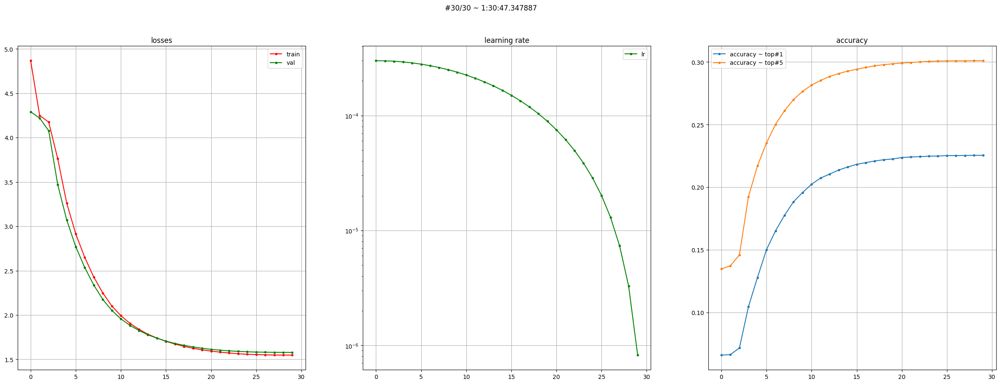

Learning process ended with early stop after epoch 30
CPU times: user 15min 45s, sys: 6min 29s, total: 22min 14s
Wall time: 1h 30min 49s


In [ ]:
%%time

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

img_fe = img_fe_class()
text_fe = text_fe_class(vocab_size)
params = {
    'img_fe': img_fe,
    'text_fe': text_fe,
    'vocab_size': vocab_size,
    'hidden_size': 512
}

epochs = 30
lr = 3e-4
min_lr = 1e-8

model, optimizer = create_model_and_optimizer(image_captioning_model, params, lr=3e-4)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

criterion = nn.CrossEntropyLoss(ignore_index=tok_to_ind['<PAD>'])

model, optimizer, losses = learning_loop(
    model = model,
    optimizer = optimizer,
    train_loader = dataloader_train,
    val_loader = dataloader_val,
    criterion = criterion,
    scheduler = scheduler,
    epochs = epochs,
    min_lr = min_lr,
    val_every = 1,
    draw_every = 1,
    separate_show = False,
    metric_names = {
        "accuracy": {"top": [1, 5], "plot_id": 1},
    },
    chkp_folder = "./chkp",
    model_name = "default",
)

### 2.8 Загрузка чекпоинта

In [ ]:
assert False, "Are you sure? If not - stop right here, otherwise - comment this assert line"

model_name = "default#0"
checkpoint = torch.load(os.path.join("./chkp", f"{model_name}.pt"))

# Создаём те же классы, что и внутри чекпоинта
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(...)

scheduler = ...

# Загружаем состояния из чекпоинта
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
epoch = checkpoint['epoch']
losses = checkpoint['losses']

## 3. Оценка результатов

### 3.1 Генерация

In [ ]:
from typing import Optional

max_seq_len = 100

def generate(
    model,
    image,
    max_seq_len: Optional[int] = max_seq_len,
    top_p: Optional[float] = None,
    top_k: Optional[int] = None,
):
    """
    По картинке image генерируете текст моделью model либо пока не сгенерируете '<EOS>' токен, либо пока не сгенерируете max_seq_len токенов
        top_k -> после получения предсказания оставляете первые top_k слов и сэмплируете случайно с перенормированными вероятностями из оставшихся слов
        top_p -> после получения предсказания оставляете первые сколько-то слов, так, чтобы суммарная вероятность оставшихся слов была не больше top_p,
            после чего сэмплируете с перенормированными вероятностями из оставшихся слов
        иначе -> сэмплируете случайное слово с предсказанными вероятностями
    """
    assert top_p is None or top_k is None, "Don't use top_p and top_k at the same time"

    model.eval()
    image = image_prepare_val(image).unsqueeze(0).to(device)

    result_tokens = [tok_to_ind['<BOS>']]
    input_seq = torch.tensor(result_tokens).reshape((1,1)).to(device)

    for _ in range(max_seq_len - 1):
        with torch.no_grad():
            #print(input_seq.shape)
            #print(input_seq)

            logits = model(image, input_seq)
            last_logits = logits[0, -1, :]

        probs = torch.softmax(last_logits, dim=-1)

        if top_k is not None:
            top_probs, top_indices = torch.topk(probs, top_k)
            probs = torch.zeros_like(probs).scatter_(0, top_indices, top_probs)
            probs = probs / probs.sum()
        elif top_p is not None:
            sorted_probs, sorted_indices = torch.sort(probs, descending=True)
            cumulative_probs = torch.cumsum(sorted_probs, dim=0)
            mask = cumulative_probs <= top_p
            if not mask.any():
                mask[0] = True
            selected_probs = sorted_probs[mask]
            selected_indices = sorted_indices[mask]
            probs = torch.zeros_like(probs).scatter_(0, selected_indices, selected_probs)
            probs = probs / probs.sum()

        next_token = torch.multinomial(probs, 1).item()
        result_tokens.append(next_token)

        input_seq = torch.tensor(result_tokens).reshape((1,-1)).to(device)

        if next_token == tok_to_ind['<EOS>']:
            break

    text_tokens = [ind_to_tok[tok] for tok in result_tokens[1:-1]]
    result_text = ' '.join(text_tokens)

    return result_tokens, result_text

### 3.2 Посмотрим на предсказания модели

In [ ]:
def wrap_text(text, max_width):
    words = text.split(" ")
    result = [[words[0]]]
    for word in words[1:]:
        if len(" ".join(result[-1])) + len(word) + 1 > max_width:
            result[-1] = " ".join(result[-1])
            result.append([])
        result[-1].append(word)
    result[-1] = " ".join(result[-1])
    return "\n".join(result)

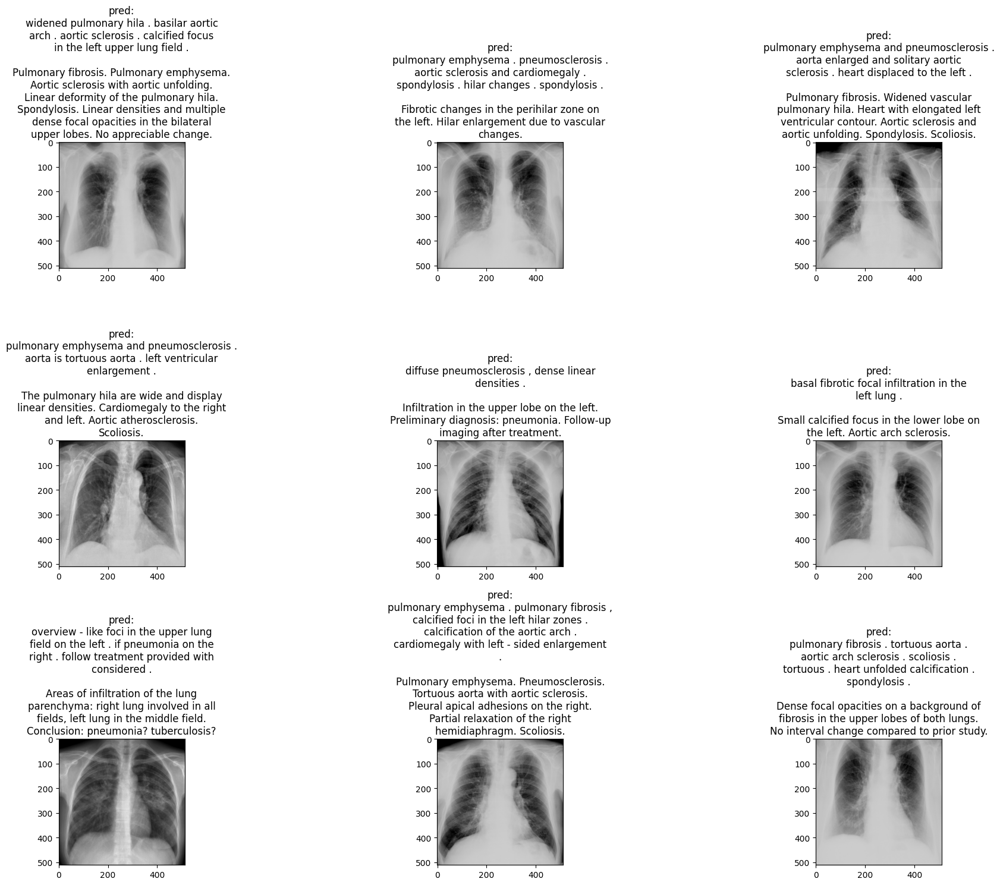

In [ ]:
inds = list(range(9))
split = 'train'

h, w = 3, 3
title_width = 43

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['pngfilepath']
    #print(img_id)
    img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))

    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)

    caption = wrap_text(row['opisanie_eng'], title_width)

    caption = 'pred:\n' + pred_caption + '\n\n' + caption

    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

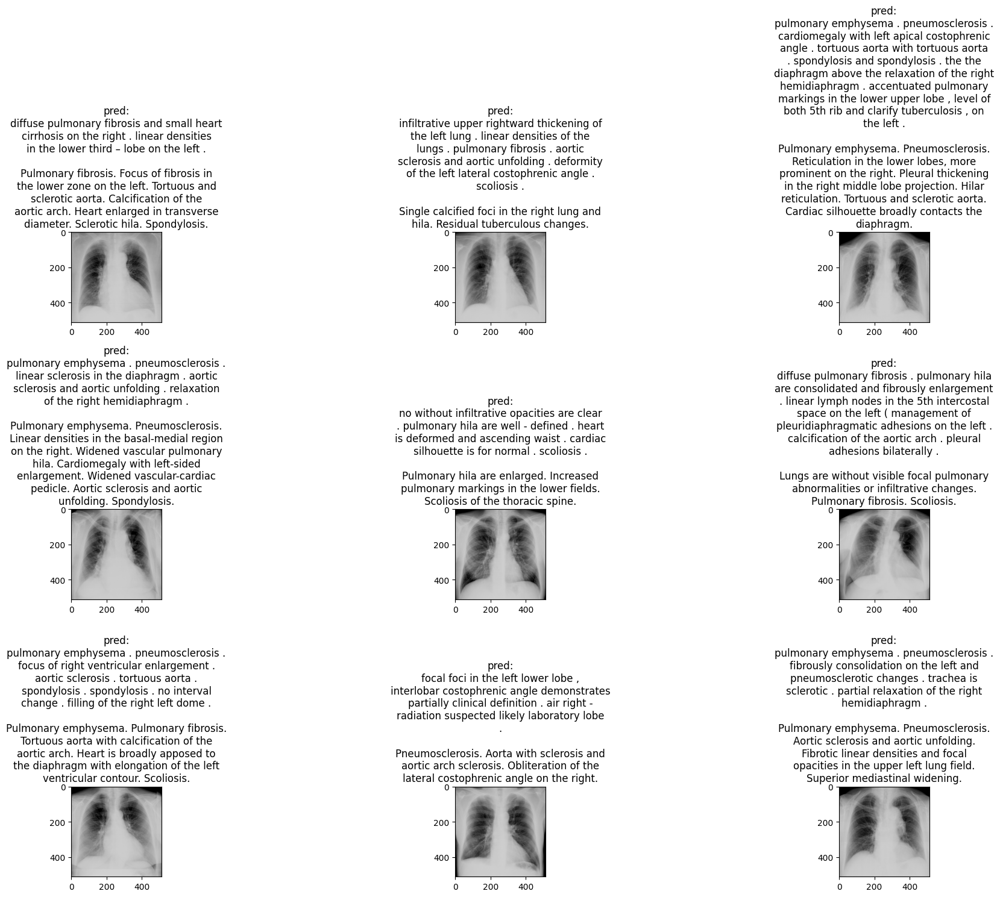

In [ ]:
inds = list(range(9))
split = 'val'

h, w = 3, 3
title_width = 43

top_p = None
top_k = 3

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['pngfilepath']
    #print(img_id)
    img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))

    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)

    caption = wrap_text(row['opisanie_eng'], title_width)

    caption = 'pred:\n' + pred_caption + '\n\n' + caption

    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

### 3.3 BLEU на всём val датасете

Посчитайте BLEU на валидации!

In [ ]:
# from torchtext.data.metrics import bleu_score
from torchmetrics.functional.text import bleu_score

def get_bleu(model, top_p=None, top_k=None, split="val"):
    candidates = []
    references = []
    for ind, row in tqdm(dfs[split].iterrows(), total=dfs[split].shape[0]):
        img_id = row['pngfilepath']
        img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))
        references.append([' '.join(tokenize(row['opisanie_eng'])[1:-1])])
        tokens, _ = generate(model, img, top_p=top_p, top_k=top_k)
        cand_tokens = [ind_to_tok[t] for t in tokens if t not in (tok_to_ind['<BOS>'], tok_to_ind['<EOS>'])]
        candidates.append(' '.join(cand_tokens))

    # Здесь считается взвешенный BLEU score по 1-4-граммам
    b1, b2, b3, b4 = (
        bleu_score(candidates, references, weights=(1, 0, 0, 0)),
        bleu_score(candidates, references, weights=(0, 1, 0, 0)),
        bleu_score(candidates, references, weights=(0, 0, 1, 0)),
        bleu_score(candidates, references, weights=(0, 0, 0, 1)),
    )
    return (
        # (b1, b2, b3, b4),
        (b1 + b2 + b3 + b4) / 4,
        # bleu_score(candidates, references),
    )

In [ ]:
from torchmetrics.text import ROUGEScore

def get_bleu_and_rouge(model, top_p=None, top_k=None, split="val"):
    candidates = []
    references = []
    for ind, row in tqdm(dfs[split].iterrows(), total=dfs[split].shape[0]):
        img_id = row['pngfilepath']
        img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))
        references.append([' '.join(tokenize(row['opisanie_eng'])[1:-1])])
        tokens, _ = generate(model, img, top_p=top_p, top_k=top_k)
        cand_tokens = [ind_to_tok[t] for t in tokens if t not in (tok_to_ind['<BOS>'], tok_to_ind['<EOS>'])]
        candidates.append(' '.join(cand_tokens))

    # Здесь считается взвешенный BLEU score по 1-4-граммам
    b1, b2, b3, b4 = (
        bleu_score(candidates, references, weights=(1, 0, 0, 0)),
        bleu_score(candidates, references, weights=(0, 1, 0, 0)),
        bleu_score(candidates, references, weights=(0, 0, 1, 0)),
        bleu_score(candidates, references, weights=(0, 0, 0, 1)),
    )
    rouge = ROUGEScore()
    return (
        (b1 + b2 + b3 + b4) / 4,
        rouge(candidates, references)
    )

In [ ]:
from aac_metrics.functional import cider_d

def get_bleu_rouge_cider(model, top_p=None, top_k=None, split="val"):
    candidates = []
    references = []
    for ind, row in tqdm(dfs[split].iterrows(), total=dfs[split].shape[0]):
        img_id = row['pngfilepath']
        img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))
        references.append([' '.join(tokenize(row['opisanie_eng'])[1:-1])])
        tokens, _ = generate(model, img, top_p=top_p, top_k=top_k)
        cand_tokens = [ind_to_tok[t] for t in tokens if t not in (tok_to_ind['<BOS>'], tok_to_ind['<EOS>'])]
        candidates.append(' '.join(cand_tokens))

    # Здесь считается взвешенный BLEU score по 1-4-граммам
    b1, b2, b3, b4 = (
        bleu_score(candidates, references, weights=(1, 0, 0, 0)),
        bleu_score(candidates, references, weights=(0, 1, 0, 0)),
        bleu_score(candidates, references, weights=(0, 0, 1, 0)),
        bleu_score(candidates, references, weights=(0, 0, 0, 1)),
    )
    rouge = ROUGEScore()
    cider_score, _ = cider_d(candidates, references)
    return (
        (b1 + b2 + b3 + b4) / 4,
        rouge(candidates, references),
        cider_score
    )

In [ ]:
bleu_res = get_bleu(model, top_p=None, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=None, top_k=1)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=None, top_k=3)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=None, top_k=5)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=1.0, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=0.9, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=0.8, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=0.5, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=0.4, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=0.2, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=0.1, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


In [ ]:
bleu_res = get_bleu(model, top_p=0.0, top_k=None)
print(bleu_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

(tensor(0.),)


## 4. Эксперименты

Try to go more epochs, and deeper LSTM

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

img_fe = img_fe_class()
text_fe = text_fe_class(vocab_size, num_layers=5)
params = {
    'img_fe': img_fe,
    'text_fe': text_fe,
    'vocab_size': vocab_size,
    'hidden_size': 512
}

epochs = 240
lr = 3e-4
min_lr = 1e-8

model, optimizer = create_model_and_optimizer(image_captioning_model, params, lr=lr)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

criterion = nn.CrossEntropyLoss(ignore_index=tok_to_ind['<PAD>'])

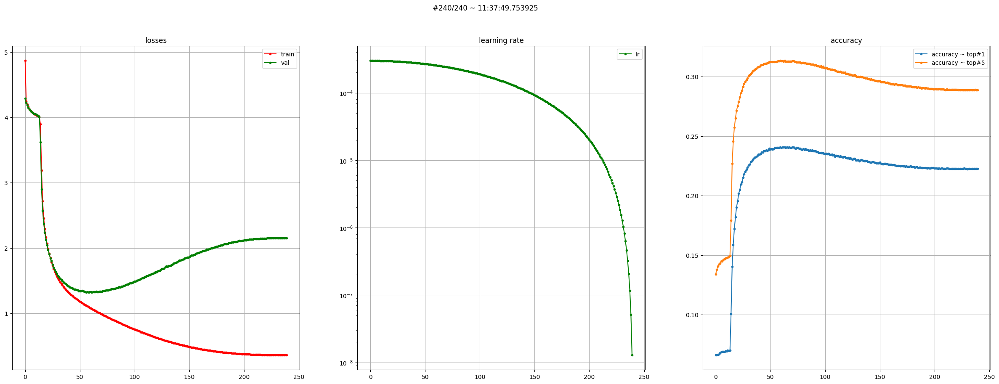

Learning process ended with early stop after epoch 240
CPU times: user 2h 30min 9s, sys: 52min 33s, total: 3h 22min 43s
Wall time: 11h 37min 51s


In [ ]:
%%time

model, optimizer, losses = learning_loop(
    model = model,
    optimizer = optimizer,
    train_loader = dataloader_train,
    val_loader = dataloader_val,
    criterion = criterion,
    scheduler = scheduler,
    epochs = epochs,
    min_lr = min_lr,
    val_every = 1,
    draw_every = 1,
    separate_show = False,
    metric_names = {
        "accuracy": {"top": [1, 5], "plot_id": 1},
    },
    chkp_folder = "./chkp",
    model_name = "240_epochs_deeper_LSTM_5_num_layers",
)

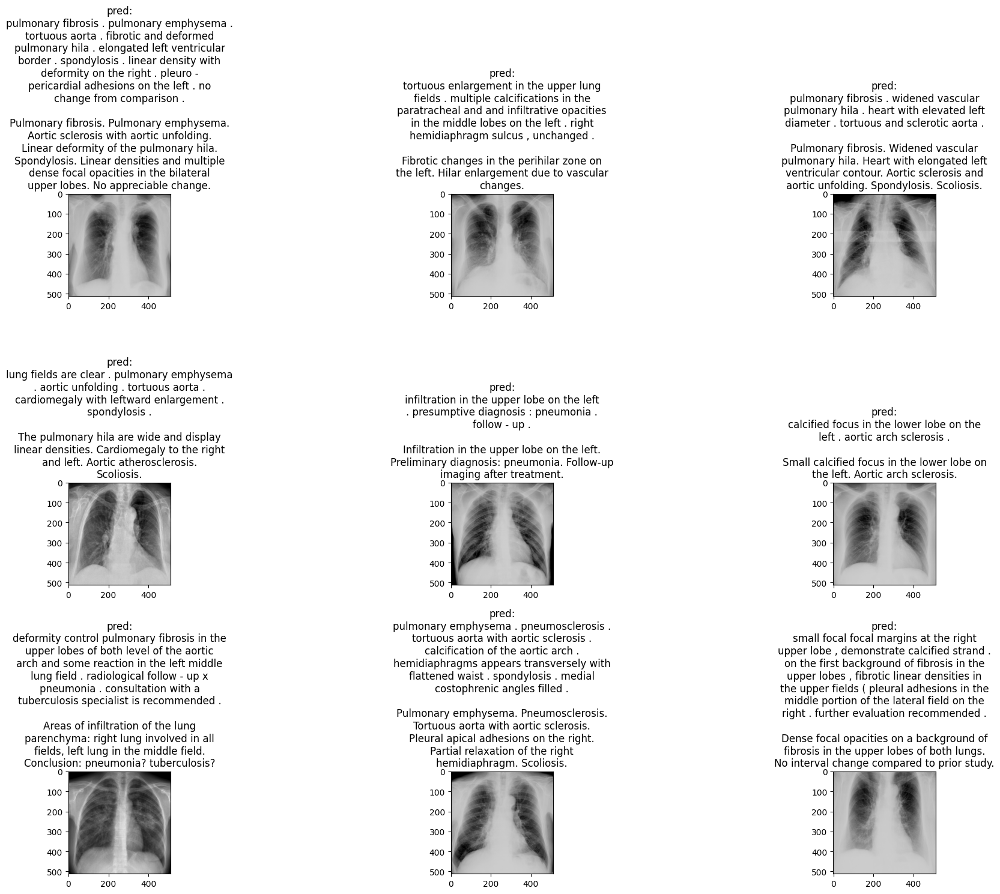

In [ ]:
inds = list(range(9))
split = 'train'

h, w = 3, 3
title_width = 43

top_p = None
top_k = 3

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['pngfilepath']
    #print(img_id)
    img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))

    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)

    caption = wrap_text(row['opisanie_eng'], title_width)

    caption = 'pred:\n' + pred_caption + '\n\n' + caption

    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

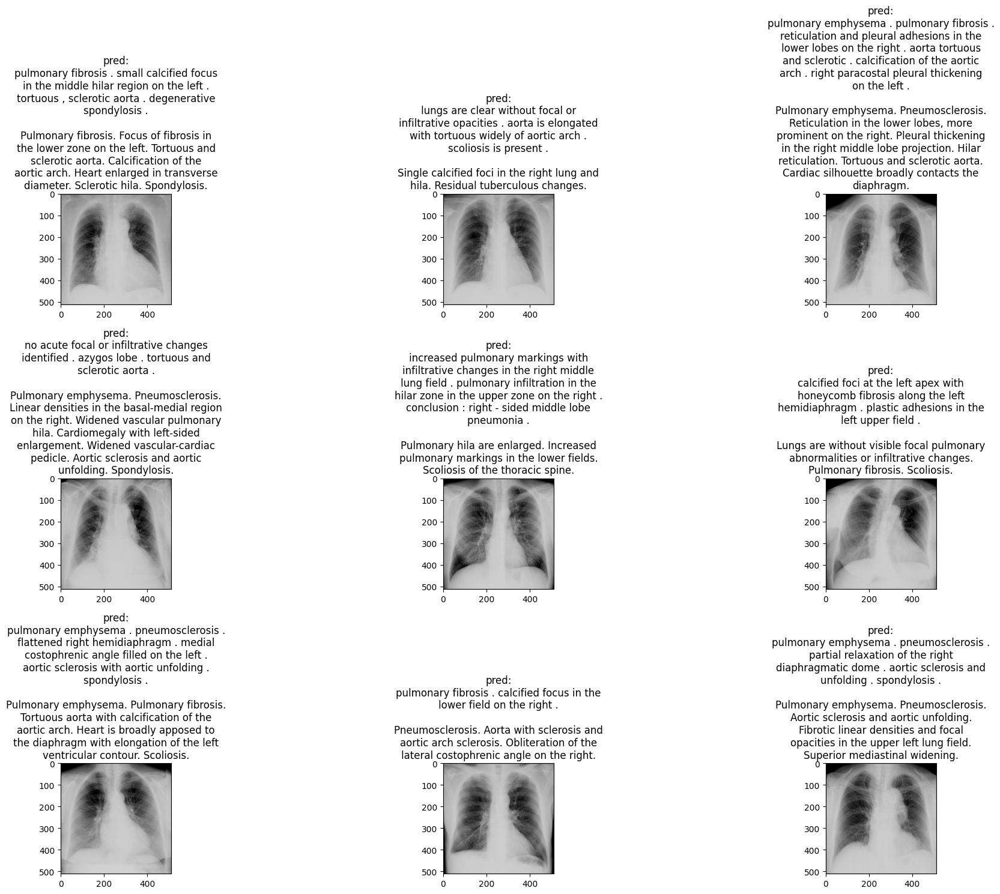

In [ ]:
inds = list(range(9))
split = 'val'

h, w = 3, 3
title_width = 43

top_p = None
top_k = 3

assert h*w >= len(inds)

fig, ax = plt.subplots(h, w, figsize=(20, 15))

for i, ind in enumerate(inds):
    row = dfs[split].iloc[ind]
    img_id = row['pngfilepath']
    #print(img_id)
    img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))

    _, pred_caption = generate(model, img)
    pred_caption = wrap_text(pred_caption, title_width)

    caption = wrap_text(row['opisanie_eng'], title_width)

    caption = 'pred:\n' + pred_caption + '\n\n' + caption

    plt.subplot(h, w, i+1)
    plt.title(caption)
    plt.imshow(img)

fig.tight_layout()
plt.show()

In [ ]:
def get_examples_of_text_generations(model, split='train', h=3, w=3, top_p=None, top_k=3, ):
    inds = list(range(h * w))
    title_width = 43
    assert h*w >= len(inds)

    fig, ax = plt.subplots(h, w, figsize=(20, 15))

    for i, ind in enumerate(inds):
        row = dfs[split].iloc[ind]
        img_id = row['pngfilepath']
        #print(img_id)
        img = cv2.imread(os.path.join(data_folder, f'{split}/img', img_id))

        _, pred_caption = generate(model, img)
        pred_caption = wrap_text(pred_caption, title_width)

        caption = wrap_text(row['opisanie_eng'], title_width)

        caption = 'pred:\n' + pred_caption + '\n\n' + caption

        plt.subplot(h, w, i+1)
        plt.title(caption)
        plt.imshow(img)

    fig.tight_layout()
    plt.show()

In [ ]:
for top_k in [None, 1,3,5]:
    bleu_res = get_bleu(model, top_p=None, top_k=top_k)
    print(f'top_p = None, top_k = {top_k}, bleu = {bleu_res}')

for top_p in [0.0, 0.1, 0.2, 0.4, 0.5, 0.8, 0.9, 1.0]:
    bleu_res = get_bleu(model, top_p=top_p, top_k=None)
    print(f'top_p = {top_p}, top_k = None, bleu = {bleu_res}')

  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = None, bleu = (tensor(0.1481),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 1, bleu = (tensor(0.1721),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 3, bleu = (tensor(0.1635),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 5, bleu = (tensor(0.1619),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.0, top_k = None, bleu = (tensor(0.1721),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.1, top_k = None, bleu = (tensor(0.1721),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.2, top_k = None, bleu = (tensor(0.1721),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.4, top_k = None, bleu = (tensor(0.1722),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.5, top_k = None, bleu = (tensor(0.1717),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.8, top_k = None, bleu = (tensor(0.1667),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.9, top_k = None, bleu = (tensor(0.1633),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 1.0, top_k = None, bleu = (tensor(0.1481),)


In [ ]:
# assert False, "Are you sure? If not - stop right here, otherwise - comment this assert line"

model_name = "240_epochs_deeper_LSTM_5_num_layers#0"
checkpoint = torch.load(os.path.join("./chkp", f"{model_name}.pt"))

lr=3e-4
# Создаём те же классы, что и внутри чекпоинта
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(image_captioning_model, params, lr=lr)

# Загружаем состояния из чекпоинта
model.load_state_dict(checkpoint['model_state_dict'])

/tmp/ipykernel_2631537/2146535301.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(os.path.join("./chkp", f"{model_name}.pt"))


<All keys matched successfully>

In [ ]:
for top_k in [None, 1,3,5]:
    bleu_res = get_bleu(model, top_p=None, top_k=top_k)
    print(f'top_p = None, top_k = {top_k}, bleu = {bleu_res}')

for top_p in [0.0, 0.1, 0.2, 0.4, 0.5, 0.8, 0.9, 1.0]:
    bleu_res = get_bleu(model, top_p=top_p, top_k=None)
    print(f'top_p = {top_p}, top_k = None, bleu = {bleu_res}')

  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = None, bleu = (tensor(0.1485),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 1, bleu = (tensor(0.1747),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 3, bleu = (tensor(0.1667),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 5, bleu = (tensor(0.1615),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.0, top_k = None, bleu = (tensor(0.1747),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.1, top_k = None, bleu = (tensor(0.1747),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.2, top_k = None, bleu = (tensor(0.1763),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.4, top_k = None, bleu = (tensor(0.1841),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.5, top_k = None, bleu = (tensor(0.1878),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.8, top_k = None, bleu = (tensor(0.1825),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.9, top_k = None, bleu = (tensor(0.1716),)


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 1.0, top_k = None, bleu = (tensor(0.1482),)


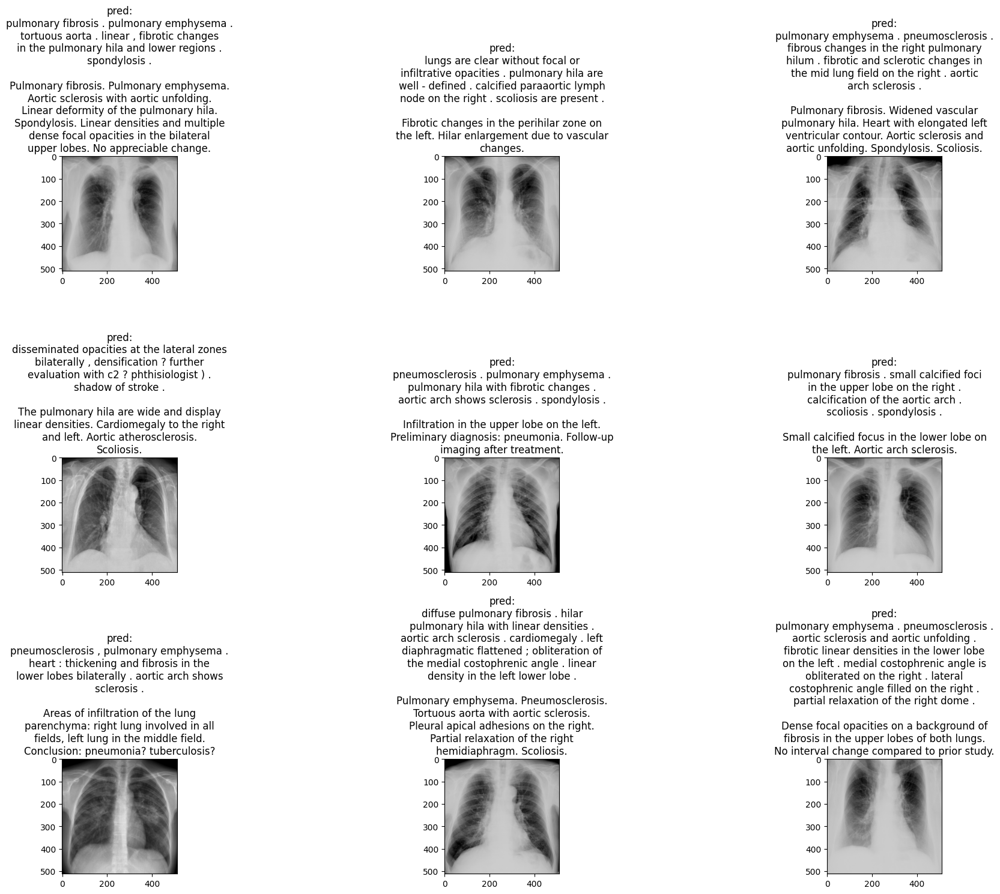

In [ ]:
get_examples_of_text_generations(model, split='train')

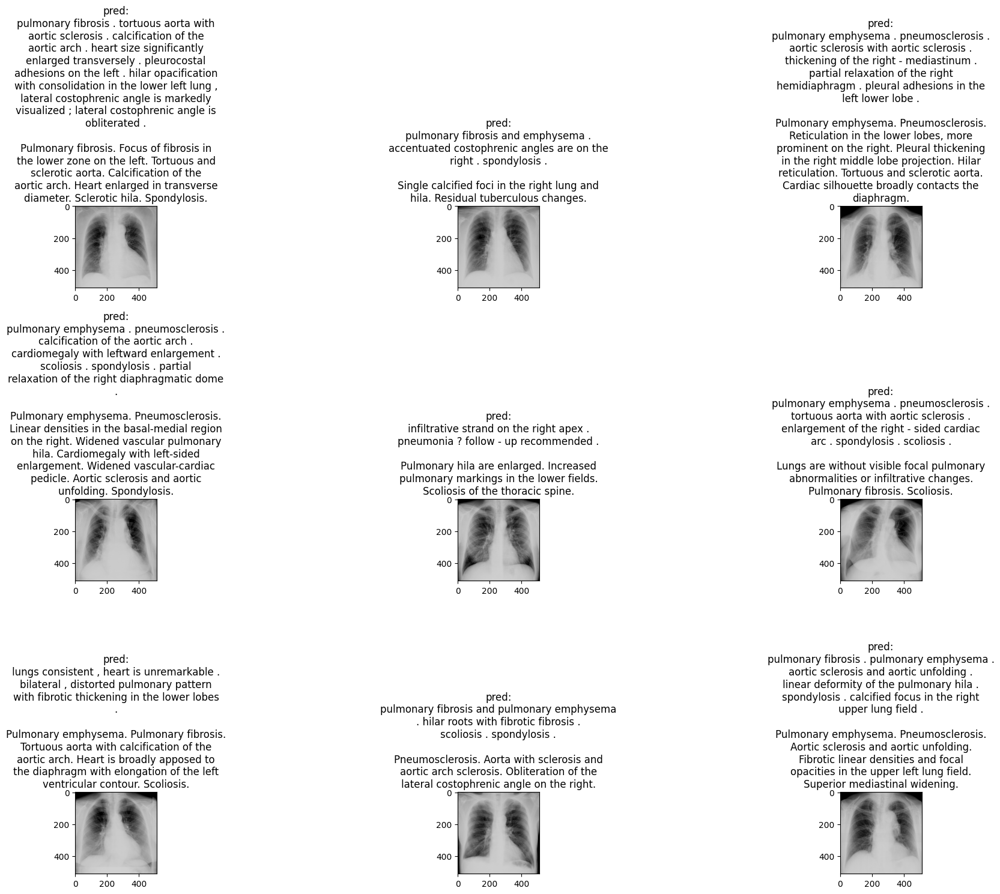

In [ ]:
get_examples_of_text_generations(model, split='val')

<h2>Доучим модель целиком (ранее был заморожен image encoder)</h2>

In [ ]:
torch.cuda.empty_cache()

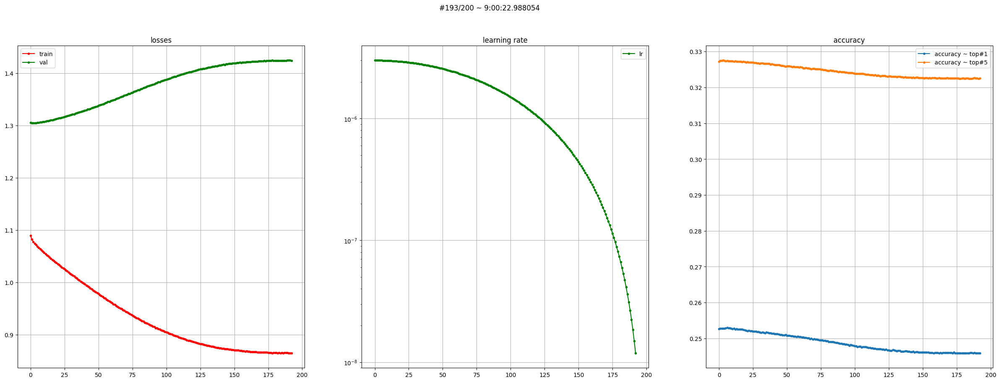

Learning process ended with early stop after epoch 193
CPU times: user 3h 18min 41s, sys: 35min 54s, total: 3h 54min 35s
Wall time: 9h 24s


In [ ]:
%%time

epochs = 200
lr = 3e-6
min_lr = 1e-8

batch_size = 256
num_workers = 4

dataloader_train = DataLoader(
    dataset=ds_train,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=True,
    drop_last=True,
    num_workers=num_workers,
)

dataloader_val = DataLoader(
    dataset=ds_val,
    batch_size=batch_size,
    collate_fn=collate_fn,
    shuffle=False,
    drop_last=False,
    num_workers=num_workers,
)

model = model.to(device)
for param in model.img_fe.fe_extractor.parameters():
    param.requires_grad = True

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
# model, optimizer = create_model_and_optimizer(image_captioning_model, params, lr=lr)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

criterion = nn.CrossEntropyLoss(ignore_index=tok_to_ind['<PAD>'])

model, optimizer, losses = learning_loop(
    model = model,
    optimizer = optimizer,
    train_loader = dataloader_train,
    val_loader = dataloader_val,
    criterion = criterion,
    scheduler = scheduler,
    epochs = epochs,
    min_lr = min_lr,
    val_every = 1,
    draw_every = 1,
    separate_show = False,
    metric_names = {
        "accuracy": {"top": [1, 5], "plot_id": 1},
    },
    chkp_folder = "./chkp",
    model_name = "240_epochs_deeper_LSTM_5_num_layers_from_last_checkpoint_unfreeze_img_encoder",
)

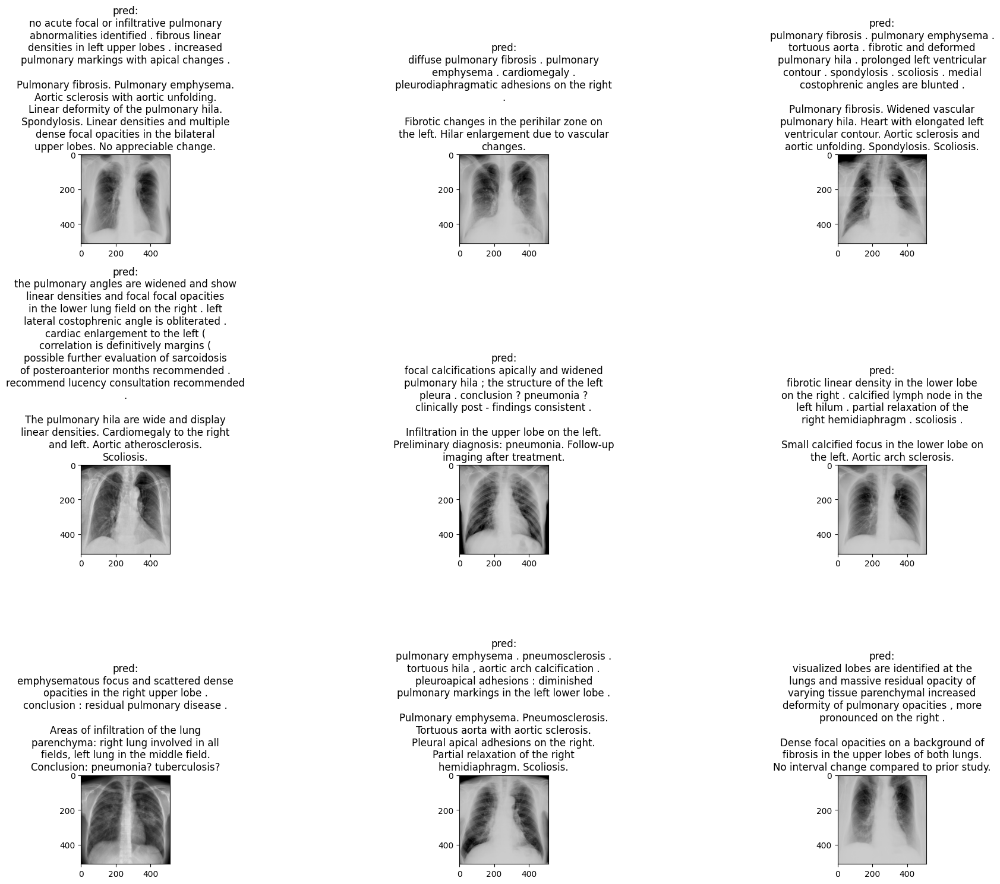

In [ ]:
get_examples_of_text_generations(model, split='train')

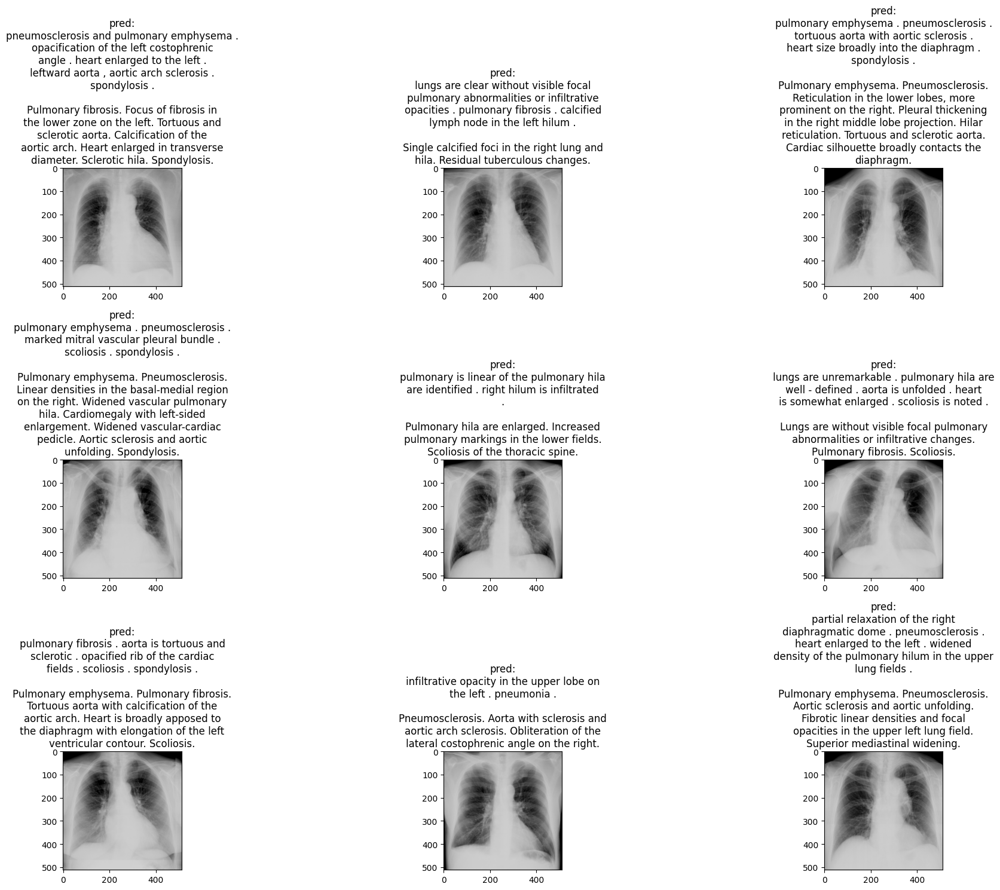

In [ ]:
get_examples_of_text_generations(model, split='val')

In [ ]:
from pprint import pprint

for top_k in [None, 1,3,5]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=None, top_k=top_k)
    print(f'top_p = None, top_k = {top_k}, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

for top_p in [0.0, 0.1, 0.2, 0.4, 0.5, 0.8, 0.9, 1.0]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=top_p, top_k=None)
    print(f'top_p = {top_p}, top_k = None, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
# assert False, "Are you sure? If not - stop right here, otherwise - comment this assert line"

model_name = "240_epochs_deeper_LSTM_5_num_layers_from_last_checkpoint_unfreeze_img_encoder#0"
checkpoint = torch.load(os.path.join("./chkp", f"{model_name}.pt"))

# Создаём те же классы, что и внутри чекпоинта
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(image_captioning_model, params, lr=lr)

# Загружаем состояния из чекпоинта
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

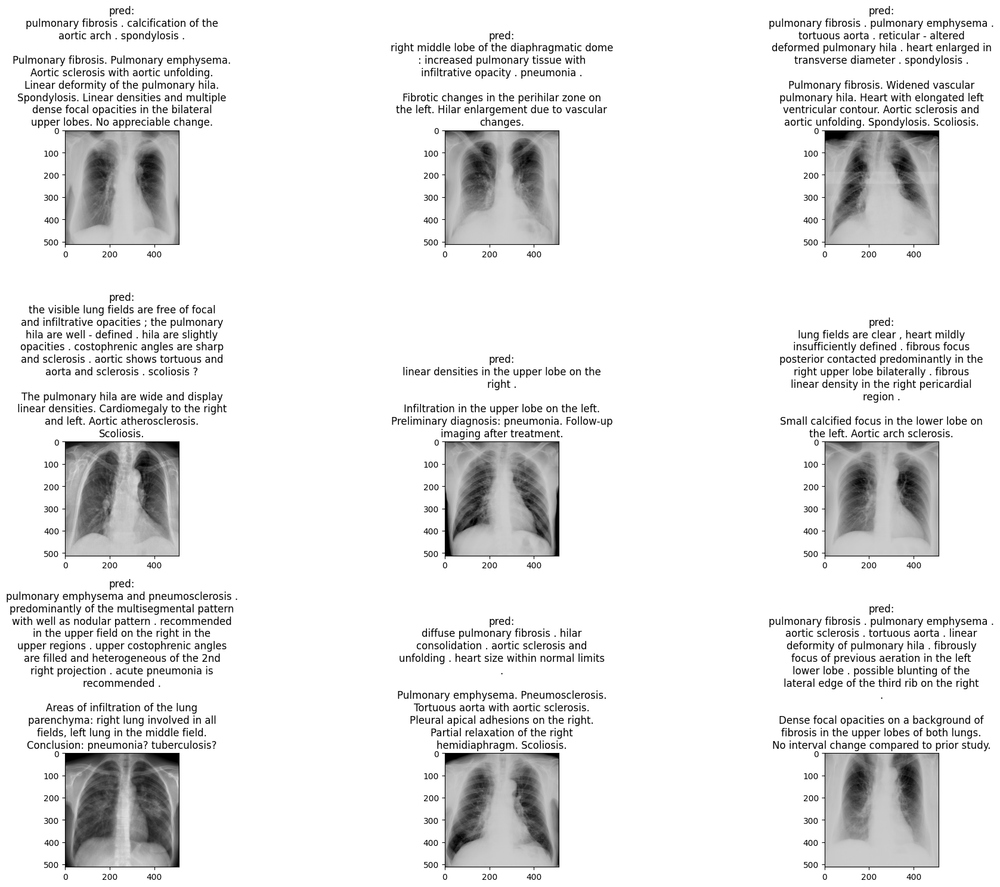

In [ ]:
get_examples_of_text_generations(model, split='train')

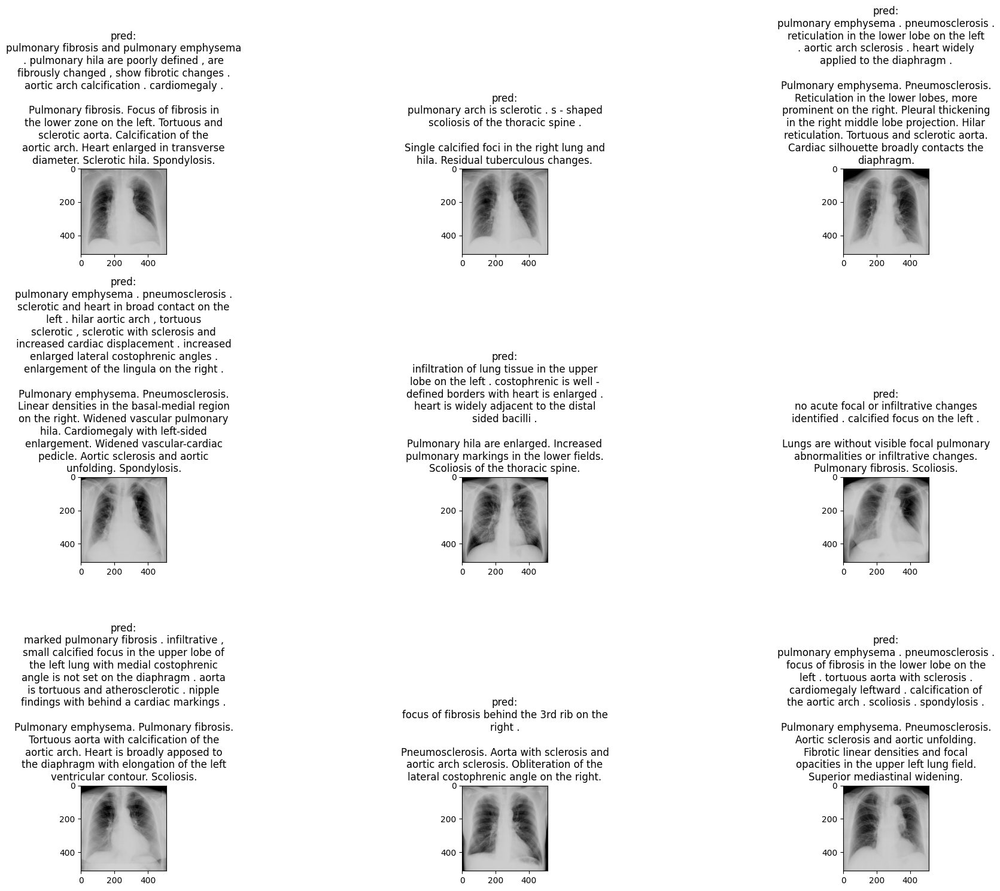

In [ ]:
get_examples_of_text_generations(model, split='val')

In [ ]:
for top_k in [None, 1,3,5]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=None, top_k=top_k)
    print(f'top_p = None, top_k = {top_k}, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

for top_p in [0.0, 0.1, 0.2, 0.4, 0.5, 0.8, 0.9, 1.0]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=top_p, top_k=None)
    print(f'top_p = {top_p}, top_k = None, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = None, bleu = 0.14994113147258759
Rouge
{'rouge1_fmeasure': tensor(0.2730),
 'rouge1_precision': tensor(0.2920),
 'rouge1_recall': tensor(0.2958),
 'rouge2_fmeasure': tensor(0.1063),
 'rouge2_precision': tensor(0.1139),
 'rouge2_recall': tensor(0.1159),
 'rougeL_fmeasure': tensor(0.2272),
 'rougeL_precision': tensor(0.2436),
 'rougeL_recall': tensor(0.2467),
 'rougeLsum_fmeasure': tensor(0.2626),
 'rougeLsum_precision': tensor(0.2809),
 'rougeLsum_recall': tensor(0.2844)}
CIDER
{'cider_d': tensor(0.1999, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 1, bleu = 0.17787019908428192
Rouge
{'rouge1_fmeasure': tensor(0.3218),
 'rouge1_precision': tensor(0.4037),
 'rouge1_recall': tensor(0.2960),
 'rouge2_fmeasure': tensor(0.1557),
 'rouge2_precision': tensor(0.1968),
 'rouge2_recall': tensor(0.1426),
 'rougeL_fmeasure': tensor(0.2897),
 'rougeL_precision': tensor(0.3643),
 'rougeL_recall': tensor(0.2663),
 'rougeLsum_fmeasure': tensor(0.3145),
 'rougeLsum_precision': tensor(0.3949),
 'rougeLsum_recall': tensor(0.2891)}
CIDER
{'cider_d': tensor(0.4540, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 3, bleu = 0.16597458720207214
Rouge
{'rouge1_fmeasure': tensor(0.3021),
 'rouge1_precision': tensor(0.3510),
 'rouge1_recall': tensor(0.2980),
 'rouge2_fmeasure': tensor(0.1281),
 'rouge2_precision': tensor(0.1506),
 'rouge2_recall': tensor(0.1257),
 'rougeL_fmeasure': tensor(0.2611),
 'rougeL_precision': tensor(0.3042),
 'rougeL_recall': tensor(0.2577),
 'rougeLsum_fmeasure': tensor(0.2919),
 'rougeLsum_precision': tensor(0.3394),
 'rougeLsum_recall': tensor(0.2878)}
CIDER
{'cider_d': tensor(0.3185, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 5, bleu = 0.1639227420091629
Rouge
{'rouge1_fmeasure': tensor(0.2983),
 'rouge1_precision': tensor(0.3392),
 'rouge1_recall': tensor(0.3004),
 'rouge2_fmeasure': tensor(0.1245),
 'rouge2_precision': tensor(0.1419),
 'rouge2_recall': tensor(0.1255),
 'rougeL_fmeasure': tensor(0.2558),
 'rougeL_precision': tensor(0.2913),
 'rougeL_recall': tensor(0.2579),
 'rougeLsum_fmeasure': tensor(0.2880),
 'rougeLsum_precision': tensor(0.3277),
 'rougeLsum_recall': tensor(0.2899)}
CIDER
{'cider_d': tensor(0.3058, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.0, top_k = None, bleu = 0.17787019908428192
Rouge
{'rouge1_fmeasure': tensor(0.3218),
 'rouge1_precision': tensor(0.4037),
 'rouge1_recall': tensor(0.2960),
 'rouge2_fmeasure': tensor(0.1557),
 'rouge2_precision': tensor(0.1968),
 'rouge2_recall': tensor(0.1426),
 'rougeL_fmeasure': tensor(0.2897),
 'rougeL_precision': tensor(0.3643),
 'rougeL_recall': tensor(0.2663),
 'rougeLsum_fmeasure': tensor(0.3145),
 'rougeLsum_precision': tensor(0.3949),
 'rougeLsum_recall': tensor(0.2891)}
CIDER
{'cider_d': tensor(0.4540, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.1, top_k = None, bleu = 0.17787019908428192
Rouge
{'rouge1_fmeasure': tensor(0.3218),
 'rouge1_precision': tensor(0.4037),
 'rouge1_recall': tensor(0.2960),
 'rouge2_fmeasure': tensor(0.1557),
 'rouge2_precision': tensor(0.1968),
 'rouge2_recall': tensor(0.1426),
 'rougeL_fmeasure': tensor(0.2897),
 'rougeL_precision': tensor(0.3643),
 'rougeL_recall': tensor(0.2663),
 'rougeLsum_fmeasure': tensor(0.3145),
 'rougeLsum_precision': tensor(0.3949),
 'rougeLsum_recall': tensor(0.2891)}
CIDER
{'cider_d': tensor(0.4540, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.2, top_k = None, bleu = 0.17904017865657806
Rouge
{'rouge1_fmeasure': tensor(0.3236),
 'rouge1_precision': tensor(0.4036),
 'rouge1_recall': tensor(0.2983),
 'rouge2_fmeasure': tensor(0.1566),
 'rouge2_precision': tensor(0.1966),
 'rouge2_recall': tensor(0.1441),
 'rougeL_fmeasure': tensor(0.2906),
 'rougeL_precision': tensor(0.3632),
 'rougeL_recall': tensor(0.2678),
 'rougeLsum_fmeasure': tensor(0.3162),
 'rougeLsum_precision': tensor(0.3947),
 'rougeLsum_recall': tensor(0.2912)}
CIDER
{'cider_d': tensor(0.4578, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.4, top_k = None, bleu = 0.18770259618759155
Rouge
{'rouge1_fmeasure': tensor(0.3299),
 'rouge1_precision': tensor(0.3941),
 'rouge1_recall': tensor(0.3136),
 'rouge2_fmeasure': tensor(0.1594),
 'rouge2_precision': tensor(0.1915),
 'rouge2_recall': tensor(0.1514),
 'rougeL_fmeasure': tensor(0.2926),
 'rougeL_precision': tensor(0.3498),
 'rougeL_recall': tensor(0.2783),
 'rougeLsum_fmeasure': tensor(0.3219),
 'rougeLsum_precision': tensor(0.3847),
 'rougeLsum_recall': tensor(0.3059)}
CIDER
{'cider_d': tensor(0.4628, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.5, top_k = None, bleu = 0.18966293334960938
Rouge
{'rouge1_fmeasure': tensor(0.3315),
 'rouge1_precision': tensor(0.3864),
 'rouge1_recall': tensor(0.3206),
 'rouge2_fmeasure': tensor(0.1569),
 'rouge2_precision': tensor(0.1840),
 'rouge2_recall': tensor(0.1516),
 'rougeL_fmeasure': tensor(0.2908),
 'rougeL_precision': tensor(0.3391),
 'rougeL_recall': tensor(0.2817),
 'rougeLsum_fmeasure': tensor(0.3227),
 'rougeLsum_precision': tensor(0.3763),
 'rougeLsum_recall': tensor(0.3120)}
CIDER
{'cider_d': tensor(0.4648, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.8, top_k = None, bleu = 0.17760460078716278
Rouge
{'rouge1_fmeasure': tensor(0.3090),
 'rouge1_precision': tensor(0.3488),
 'rouge1_recall': tensor(0.3114),
 'rouge2_fmeasure': tensor(0.1397),
 'rouge2_precision': tensor(0.1589),
 'rouge2_recall': tensor(0.1401),
 'rougeL_fmeasure': tensor(0.2671),
 'rougeL_precision': tensor(0.3018),
 'rougeL_recall': tensor(0.2698),
 'rougeLsum_fmeasure': tensor(0.2994),
 'rougeLsum_precision': tensor(0.3381),
 'rougeLsum_recall': tensor(0.3015)}
CIDER
{'cider_d': tensor(0.3558, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.9, top_k = None, bleu = 0.17062100768089294
Rouge
{'rouge1_fmeasure': tensor(0.2966),
 'rouge1_precision': tensor(0.3265),
 'rouge1_recall': tensor(0.3076),
 'rouge2_fmeasure': tensor(0.1281),
 'rouge2_precision': tensor(0.1421),
 'rouge2_recall': tensor(0.1330),
 'rougeL_fmeasure': tensor(0.2523),
 'rougeL_precision': tensor(0.2779),
 'rougeL_recall': tensor(0.2620),
 'rougeLsum_fmeasure': tensor(0.2863),
 'rougeLsum_precision': tensor(0.3153),
 'rougeLsum_recall': tensor(0.2966)}
CIDER
{'cider_d': tensor(0.2969, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 1.0, top_k = None, bleu = 0.15020833909511566
Rouge
{'rouge1_fmeasure': tensor(0.2715),
 'rouge1_precision': tensor(0.2930),
 'rouge1_recall': tensor(0.2942),
 'rouge2_fmeasure': tensor(0.1051),
 'rouge2_precision': tensor(0.1138),
 'rouge2_recall': tensor(0.1143),
 'rougeL_fmeasure': tensor(0.2270),
 'rougeL_precision': tensor(0.2456),
 'rougeL_recall': tensor(0.2462),
 'rougeLsum_fmeasure': tensor(0.2610),
 'rougeLsum_precision': tensor(0.2819),
 'rougeLsum_recall': tensor(0.2827)}
CIDER
{'cider_d': tensor(0.1879, dtype=torch.float64)}


In [ ]:
# assert False, "Are you sure? If not - stop right here, otherwise - comment this assert line"

model_name = "240_epochs_deeper_LSTM_5_num_layers_from_last_checkpoint_unfreeze_img_encoder#1"
checkpoint = torch.load(os.path.join("./chkp", f"{model_name}.pt"))

# Создаём те же классы, что и внутри чекпоинта
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model, optimizer = create_model_and_optimizer(image_captioning_model, params, lr=lr)

# Загружаем состояния из чекпоинта
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

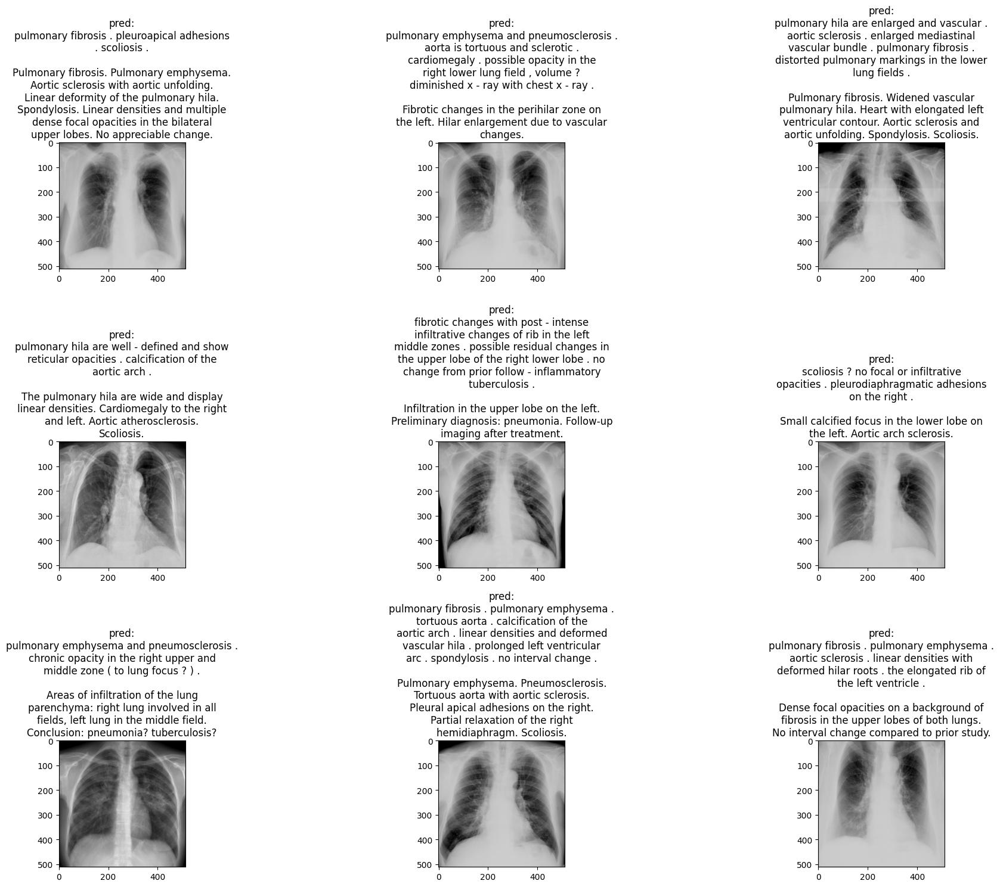

In [ ]:
get_examples_of_text_generations(model, split='train')

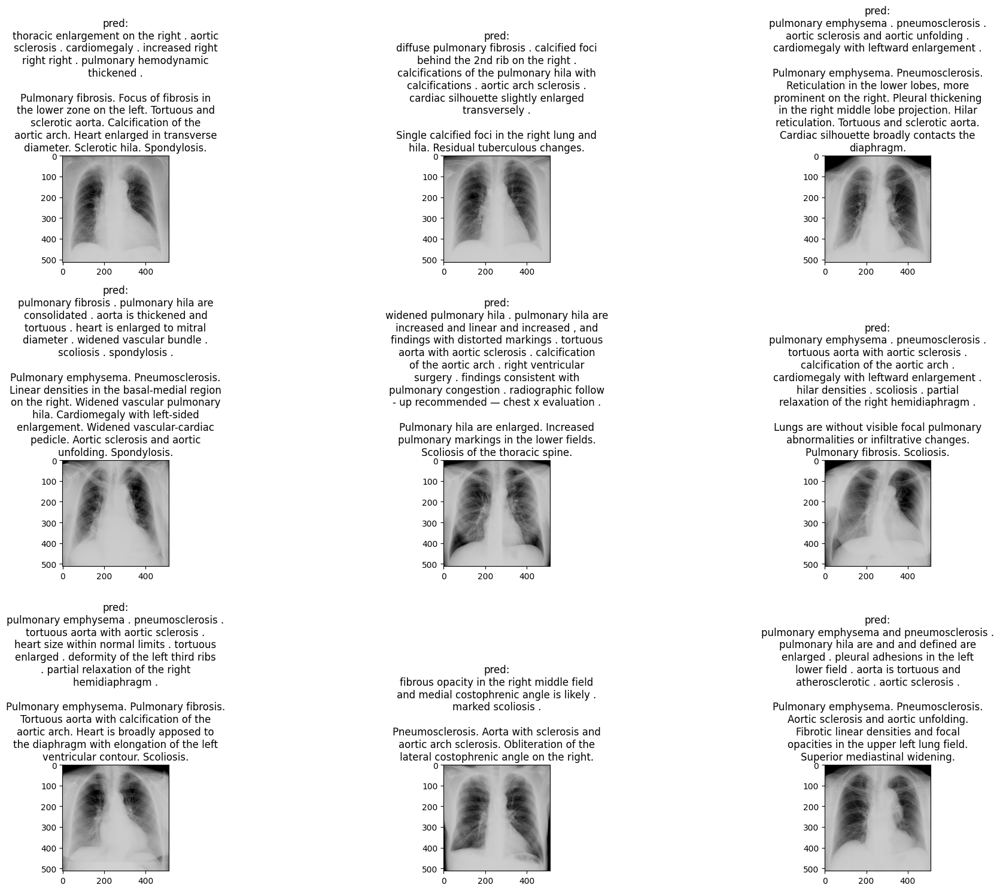

In [ ]:
get_examples_of_text_generations(model, split='val')

In [ ]:
for top_k in [None, 1,3,5]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=None, top_k=top_k)
    print(f'top_p = None, top_k = {top_k}, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

for top_p in [0.0, 0.1, 0.2, 0.4, 0.5, 0.8, 0.9, 1.0]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=top_p, top_k=None)
    print(f'top_p = {top_p}, top_k = None, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = None, bleu = 0.14955370128154755
Rouge
{'rouge1_fmeasure': tensor(0.2713),
 'rouge1_precision': tensor(0.2899),
 'rouge1_recall': tensor(0.2965),
 'rouge2_fmeasure': tensor(0.1061),
 'rouge2_precision': tensor(0.1144),
 'rouge2_recall': tensor(0.1159),
 'rougeL_fmeasure': tensor(0.2268),
 'rougeL_precision': tensor(0.2433),
 'rougeL_recall': tensor(0.2481),
 'rougeLsum_fmeasure': tensor(0.2607),
 'rougeLsum_precision': tensor(0.2788),
 'rougeLsum_recall': tensor(0.2848)}
CIDER
{'cider_d': tensor(0.1943, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 1, bleu = 0.1777811497449875
Rouge
{'rouge1_fmeasure': tensor(0.3202),
 'rouge1_precision': tensor(0.4013),
 'rouge1_recall': tensor(0.2955),
 'rouge2_fmeasure': tensor(0.1536),
 'rouge2_precision': tensor(0.1941),
 'rouge2_recall': tensor(0.1414),
 'rougeL_fmeasure': tensor(0.2873),
 'rougeL_precision': tensor(0.3616),
 'rougeL_recall': tensor(0.2647),
 'rougeLsum_fmeasure': tensor(0.3130),
 'rougeLsum_precision': tensor(0.3926),
 'rougeLsum_recall': tensor(0.2886)}
CIDER
{'cider_d': tensor(0.4533, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 3, bleu = 0.16682875156402588
Rouge
{'rouge1_fmeasure': tensor(0.3025),
 'rouge1_precision': tensor(0.3510),
 'rouge1_recall': tensor(0.2989),
 'rouge2_fmeasure': tensor(0.1298),
 'rouge2_precision': tensor(0.1516),
 'rouge2_recall': tensor(0.1284),
 'rougeL_fmeasure': tensor(0.2614),
 'rougeL_precision': tensor(0.3039),
 'rougeL_recall': tensor(0.2586),
 'rougeLsum_fmeasure': tensor(0.2931),
 'rougeLsum_precision': tensor(0.3403),
 'rougeLsum_recall': tensor(0.2895)}
CIDER
{'cider_d': tensor(0.3344, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 5, bleu = 0.16301946341991425
Rouge
{'rouge1_fmeasure': tensor(0.2977),
 'rouge1_precision': tensor(0.3389),
 'rouge1_recall': tensor(0.2996),
 'rouge2_fmeasure': tensor(0.1226),
 'rouge2_precision': tensor(0.1408),
 'rouge2_recall': tensor(0.1232),
 'rougeL_fmeasure': tensor(0.2543),
 'rougeL_precision': tensor(0.2900),
 'rougeL_recall': tensor(0.2563),
 'rougeLsum_fmeasure': tensor(0.2877),
 'rougeLsum_precision': tensor(0.3279),
 'rougeLsum_recall': tensor(0.2893)}
CIDER
{'cider_d': tensor(0.2952, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.0, top_k = None, bleu = 0.1777811497449875
Rouge
{'rouge1_fmeasure': tensor(0.3202),
 'rouge1_precision': tensor(0.4013),
 'rouge1_recall': tensor(0.2955),
 'rouge2_fmeasure': tensor(0.1536),
 'rouge2_precision': tensor(0.1941),
 'rouge2_recall': tensor(0.1414),
 'rougeL_fmeasure': tensor(0.2873),
 'rougeL_precision': tensor(0.3616),
 'rougeL_recall': tensor(0.2647),
 'rougeLsum_fmeasure': tensor(0.3130),
 'rougeLsum_precision': tensor(0.3926),
 'rougeLsum_recall': tensor(0.2886)}
CIDER
{'cider_d': tensor(0.4533, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.1, top_k = None, bleu = 0.1777811497449875
Rouge
{'rouge1_fmeasure': tensor(0.3202),
 'rouge1_precision': tensor(0.4013),
 'rouge1_recall': tensor(0.2955),
 'rouge2_fmeasure': tensor(0.1536),
 'rouge2_precision': tensor(0.1941),
 'rouge2_recall': tensor(0.1414),
 'rougeL_fmeasure': tensor(0.2873),
 'rougeL_precision': tensor(0.3616),
 'rougeL_recall': tensor(0.2647),
 'rougeLsum_fmeasure': tensor(0.3130),
 'rougeLsum_precision': tensor(0.3926),
 'rougeLsum_recall': tensor(0.2886)}
CIDER
{'cider_d': tensor(0.4533, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.2, top_k = None, bleu = 0.17820706963539124
Rouge
{'rouge1_fmeasure': tensor(0.3200),
 'rouge1_precision': tensor(0.3997),
 'rouge1_recall': tensor(0.2961),
 'rouge2_fmeasure': tensor(0.1536),
 'rouge2_precision': tensor(0.1933),
 'rouge2_recall': tensor(0.1418),
 'rougeL_fmeasure': tensor(0.2868),
 'rougeL_precision': tensor(0.3595),
 'rougeL_recall': tensor(0.2650),
 'rougeLsum_fmeasure': tensor(0.3130),
 'rougeLsum_precision': tensor(0.3912),
 'rougeLsum_recall': tensor(0.2894)}
CIDER
{'cider_d': tensor(0.4520, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.4, top_k = None, bleu = 0.1864822506904602
Rouge
{'rouge1_fmeasure': tensor(0.3277),
 'rouge1_precision': tensor(0.3925),
 'rouge1_recall': tensor(0.3112),
 'rouge2_fmeasure': tensor(0.1576),
 'rouge2_precision': tensor(0.1895),
 'rouge2_recall': tensor(0.1494),
 'rougeL_fmeasure': tensor(0.2911),
 'rougeL_precision': tensor(0.3495),
 'rougeL_recall': tensor(0.2764),
 'rougeLsum_fmeasure': tensor(0.3195),
 'rougeLsum_precision': tensor(0.3828),
 'rougeLsum_recall': tensor(0.3032)}
CIDER
{'cider_d': tensor(0.4688, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.5, top_k = None, bleu = 0.1915646195411682
Rouge
{'rouge1_fmeasure': tensor(0.3306),
 'rouge1_precision': tensor(0.3847),
 'rouge1_recall': tensor(0.3215),
 'rouge2_fmeasure': tensor(0.1580),
 'rouge2_precision': tensor(0.1850),
 'rouge2_recall': tensor(0.1531),
 'rougeL_fmeasure': tensor(0.2905),
 'rougeL_precision': tensor(0.3384),
 'rougeL_recall': tensor(0.2828),
 'rougeLsum_fmeasure': tensor(0.3224),
 'rougeLsum_precision': tensor(0.3753),
 'rougeLsum_recall': tensor(0.3136)}
CIDER
{'cider_d': tensor(0.4660, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.8, top_k = None, bleu = 0.18234844505786896
Rouge
{'rouge1_fmeasure': tensor(0.3124),
 'rouge1_precision': tensor(0.3488),
 'rouge1_recall': tensor(0.3167),
 'rouge2_fmeasure': tensor(0.1440),
 'rouge2_precision': tensor(0.1614),
 'rouge2_recall': tensor(0.1460),
 'rougeL_fmeasure': tensor(0.2703),
 'rougeL_precision': tensor(0.3018),
 'rougeL_recall': tensor(0.2746),
 'rougeLsum_fmeasure': tensor(0.3032),
 'rougeLsum_precision': tensor(0.3386),
 'rougeLsum_recall': tensor(0.3075)}
CIDER
{'cider_d': tensor(0.3794, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.9, top_k = None, bleu = 0.17079468071460724
Rouge
{'rouge1_fmeasure': tensor(0.2951),
 'rouge1_precision': tensor(0.3266),
 'rouge1_recall': tensor(0.3053),
 'rouge2_fmeasure': tensor(0.1280),
 'rouge2_precision': tensor(0.1423),
 'rouge2_recall': tensor(0.1329),
 'rougeL_fmeasure': tensor(0.2514),
 'rougeL_precision': tensor(0.2787),
 'rougeL_recall': tensor(0.2605),
 'rougeLsum_fmeasure': tensor(0.2849),
 'rougeLsum_precision': tensor(0.3155),
 'rougeLsum_recall': tensor(0.2947)}
CIDER
{'cider_d': tensor(0.2876, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 1.0, top_k = None, bleu = 0.151736781001091
Rouge
{'rouge1_fmeasure': tensor(0.2758),
 'rouge1_precision': tensor(0.2947),
 'rouge1_recall': tensor(0.2997),
 'rouge2_fmeasure': tensor(0.1103),
 'rouge2_precision': tensor(0.1185),
 'rouge2_recall': tensor(0.1196),
 'rougeL_fmeasure': tensor(0.2319),
 'rougeL_precision': tensor(0.2484),
 'rougeL_recall': tensor(0.2522),
 'rougeLsum_fmeasure': tensor(0.2659),
 'rougeLsum_precision': tensor(0.2842),
 'rougeLsum_recall': tensor(0.2888)}
CIDER
{'cider_d': tensor(0.2023, dtype=torch.float64)}


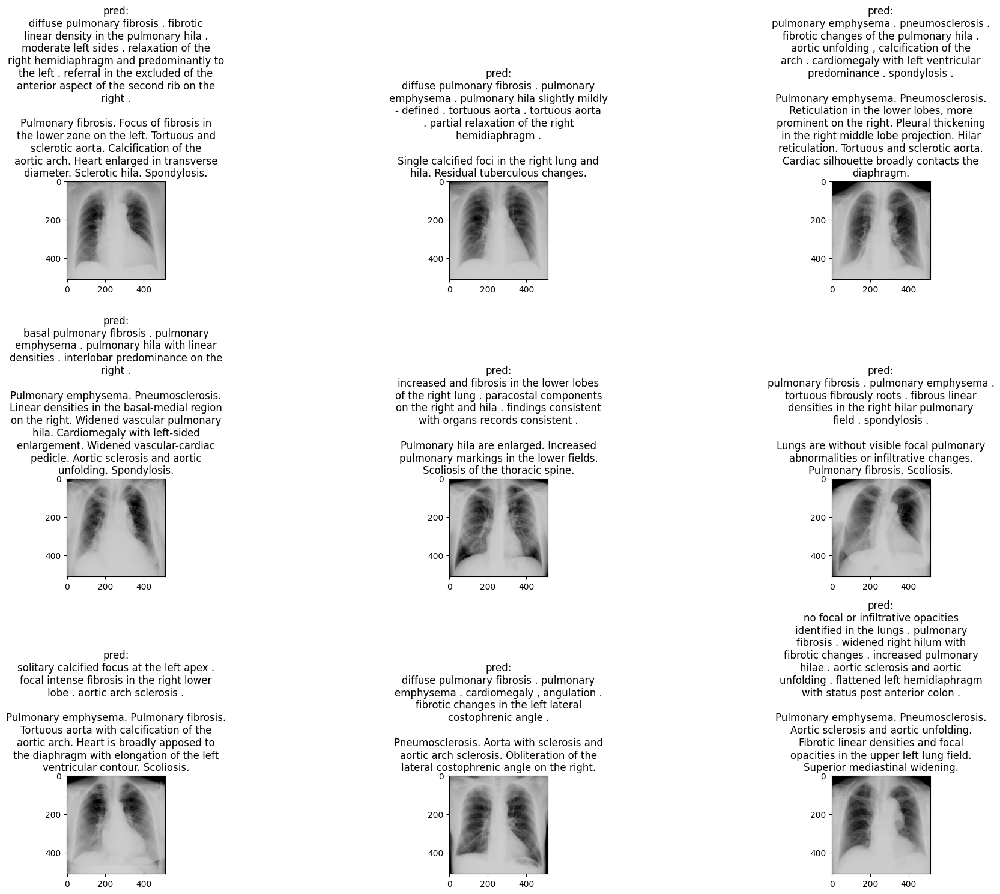

In [ ]:
get_examples_of_text_generations(model, split='val', top_p=0.5)

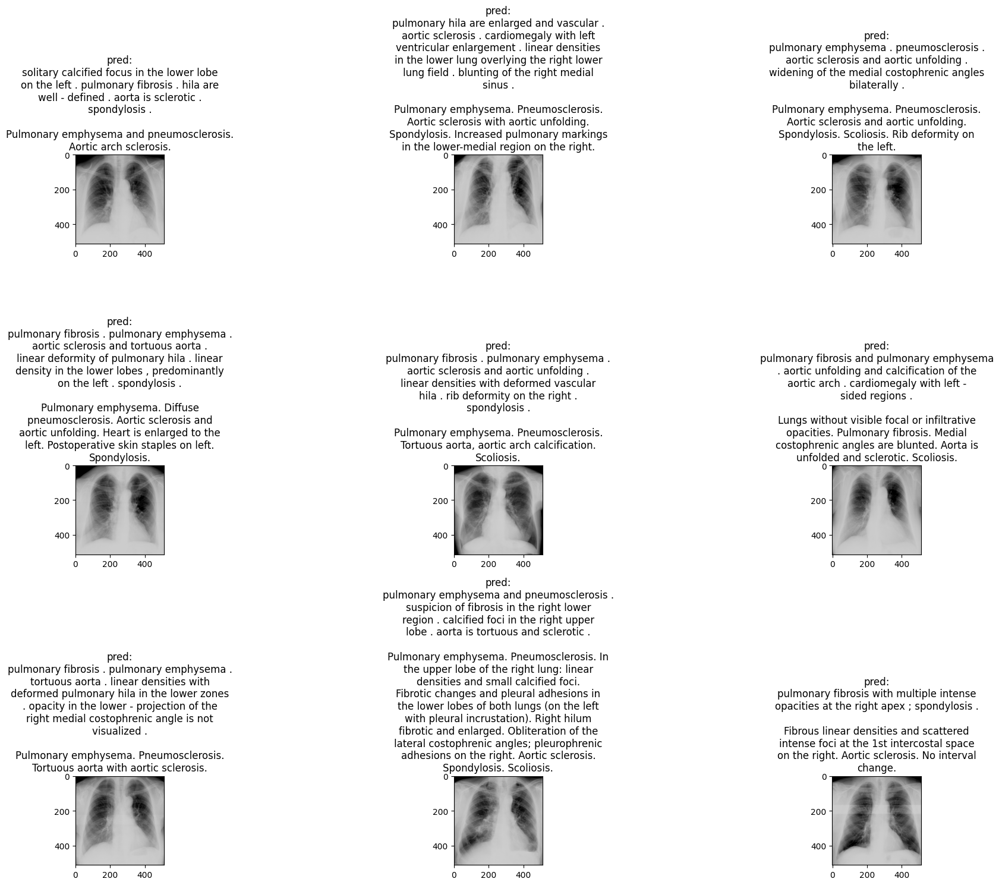

In [ ]:
get_examples_of_text_generations(model, split='test', top_p=0.5)

In [ ]:
for top_k in [None, 1,3,5]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=None, top_k=top_k, split='test')
    print(f'top_p = None, top_k = {top_k}, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

for top_p in [0.0, 0.1, 0.2, 0.4, 0.5, 0.8, 0.9, 1.0]:
    bleu_res, rouge_res, cider_res = get_bleu_rouge_cider(model, top_p=top_p, top_k=None, split='test')
    print(f'top_p = {top_p}, top_k = None, bleu = {bleu_res}')
    print('Rouge')
    pprint(rouge_res)
    print('CIDER')
    print(cider_res)

  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = None, bleu = 0.14726436138153076
Rouge
{'rouge1_fmeasure': tensor(0.2705),
 'rouge1_precision': tensor(0.2895),
 'rouge1_recall': tensor(0.2946),
 'rouge2_fmeasure': tensor(0.1057),
 'rouge2_precision': tensor(0.1139),
 'rouge2_recall': tensor(0.1157),
 'rougeL_fmeasure': tensor(0.2262),
 'rougeL_precision': tensor(0.2429),
 'rougeL_recall': tensor(0.2467),
 'rougeLsum_fmeasure': tensor(0.2598),
 'rougeLsum_precision': tensor(0.2783),
 'rougeLsum_recall': tensor(0.2828)}
CIDER
{'cider_d': tensor(0.1939, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 1, bleu = 0.17805472016334534
Rouge
{'rouge1_fmeasure': tensor(0.3212),
 'rouge1_precision': tensor(0.3991),
 'rouge1_recall': tensor(0.2972),
 'rouge2_fmeasure': tensor(0.1525),
 'rouge2_precision': tensor(0.1906),
 'rouge2_recall': tensor(0.1411),
 'rougeL_fmeasure': tensor(0.2884),
 'rougeL_precision': tensor(0.3597),
 'rougeL_recall': tensor(0.2665),
 'rougeLsum_fmeasure': tensor(0.3139),
 'rougeLsum_precision': tensor(0.3901),
 'rougeLsum_recall': tensor(0.2903)}
CIDER
{'cider_d': tensor(0.4563, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 3, bleu = 0.16441021859645844
Rouge
{'rouge1_fmeasure': tensor(0.2967),
 'rouge1_precision': tensor(0.3430),
 'rouge1_recall': tensor(0.2932),
 'rouge2_fmeasure': tensor(0.1260),
 'rouge2_precision': tensor(0.1473),
 'rouge2_recall': tensor(0.1245),
 'rougeL_fmeasure': tensor(0.2565),
 'rougeL_precision': tensor(0.2974),
 'rougeL_recall': tensor(0.2535),
 'rougeLsum_fmeasure': tensor(0.2873),
 'rougeLsum_precision': tensor(0.3324),
 'rougeLsum_recall': tensor(0.2837)}
CIDER
{'cider_d': tensor(0.3187, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = None, top_k = 5, bleu = 0.16330838203430176
Rouge
{'rouge1_fmeasure': tensor(0.2942),
 'rouge1_precision': tensor(0.3343),
 'rouge1_recall': tensor(0.2972),
 'rouge2_fmeasure': tensor(0.1223),
 'rouge2_precision': tensor(0.1402),
 'rouge2_recall': tensor(0.1231),
 'rougeL_fmeasure': tensor(0.2517),
 'rougeL_precision': tensor(0.2866),
 'rougeL_recall': tensor(0.2543),
 'rougeLsum_fmeasure': tensor(0.2844),
 'rougeLsum_precision': tensor(0.3233),
 'rougeLsum_recall': tensor(0.2871)}
CIDER
{'cider_d': tensor(0.2917, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.0, top_k = None, bleu = 0.17805472016334534
Rouge
{'rouge1_fmeasure': tensor(0.3212),
 'rouge1_precision': tensor(0.3991),
 'rouge1_recall': tensor(0.2972),
 'rouge2_fmeasure': tensor(0.1525),
 'rouge2_precision': tensor(0.1906),
 'rouge2_recall': tensor(0.1411),
 'rougeL_fmeasure': tensor(0.2884),
 'rougeL_precision': tensor(0.3597),
 'rougeL_recall': tensor(0.2665),
 'rougeLsum_fmeasure': tensor(0.3139),
 'rougeLsum_precision': tensor(0.3901),
 'rougeLsum_recall': tensor(0.2903)}
CIDER
{'cider_d': tensor(0.4563, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.1, top_k = None, bleu = 0.17805472016334534
Rouge
{'rouge1_fmeasure': tensor(0.3212),
 'rouge1_precision': tensor(0.3991),
 'rouge1_recall': tensor(0.2972),
 'rouge2_fmeasure': tensor(0.1525),
 'rouge2_precision': tensor(0.1906),
 'rouge2_recall': tensor(0.1411),
 'rougeL_fmeasure': tensor(0.2884),
 'rougeL_precision': tensor(0.3597),
 'rougeL_recall': tensor(0.2665),
 'rougeLsum_fmeasure': tensor(0.3139),
 'rougeLsum_precision': tensor(0.3901),
 'rougeLsum_recall': tensor(0.2903)}
CIDER
{'cider_d': tensor(0.4563, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.2, top_k = None, bleu = 0.1784580945968628
Rouge
{'rouge1_fmeasure': tensor(0.3210),
 'rouge1_precision': tensor(0.3974),
 'rouge1_recall': tensor(0.2975),
 'rouge2_fmeasure': tensor(0.1522),
 'rouge2_precision': tensor(0.1895),
 'rouge2_recall': tensor(0.1410),
 'rougeL_fmeasure': tensor(0.2879),
 'rougeL_precision': tensor(0.3577),
 'rougeL_recall': tensor(0.2665),
 'rougeLsum_fmeasure': tensor(0.3138),
 'rougeLsum_precision': tensor(0.3885),
 'rougeLsum_recall': tensor(0.2907)}
CIDER
{'cider_d': tensor(0.4576, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.4, top_k = None, bleu = 0.18563082814216614
Rouge
{'rouge1_fmeasure': tensor(0.3247),
 'rouge1_precision': tensor(0.3828),
 'rouge1_recall': tensor(0.3121),
 'rouge2_fmeasure': tensor(0.1525),
 'rouge2_precision': tensor(0.1804),
 'rouge2_recall': tensor(0.1471),
 'rougeL_fmeasure': tensor(0.2875),
 'rougeL_precision': tensor(0.3396),
 'rougeL_recall': tensor(0.2767),
 'rougeLsum_fmeasure': tensor(0.3167),
 'rougeLsum_precision': tensor(0.3734),
 'rougeLsum_recall': tensor(0.3045)}
CIDER
{'cider_d': tensor(0.4441, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.5, top_k = None, bleu = 0.1878848671913147
Rouge
{'rouge1_fmeasure': tensor(0.3259),
 'rouge1_precision': tensor(0.3770),
 'rouge1_recall': tensor(0.3193),
 'rouge2_fmeasure': tensor(0.1518),
 'rouge2_precision': tensor(0.1765),
 'rouge2_recall': tensor(0.1487),
 'rougeL_fmeasure': tensor(0.2857),
 'rougeL_precision': tensor(0.3308),
 'rougeL_recall': tensor(0.2803),
 'rougeLsum_fmeasure': tensor(0.3171),
 'rougeLsum_precision': tensor(0.3667),
 'rougeLsum_recall': tensor(0.3107)}
CIDER
{'cider_d': tensor(0.4316, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.8, top_k = None, bleu = 0.18373122811317444
Rouge
{'rouge1_fmeasure': tensor(0.3120),
 'rouge1_precision': tensor(0.3466),
 'rouge1_recall': tensor(0.3177),
 'rouge2_fmeasure': tensor(0.1429),
 'rouge2_precision': tensor(0.1598),
 'rouge2_recall': tensor(0.1455),
 'rougeL_fmeasure': tensor(0.2708),
 'rougeL_precision': tensor(0.3009),
 'rougeL_recall': tensor(0.2763),
 'rougeLsum_fmeasure': tensor(0.3026),
 'rougeLsum_precision': tensor(0.3362),
 'rougeLsum_recall': tensor(0.3082)}
CIDER
{'cider_d': tensor(0.3593, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 0.9, top_k = None, bleu = 0.17077921330928802
Rouge
{'rouge1_fmeasure': tensor(0.2952),
 'rouge1_precision': tensor(0.3224),
 'rouge1_recall': tensor(0.3069),
 'rouge2_fmeasure': tensor(0.1267),
 'rouge2_precision': tensor(0.1393),
 'rouge2_recall': tensor(0.1317),
 'rougeL_fmeasure': tensor(0.2515),
 'rougeL_precision': tensor(0.2750),
 'rougeL_recall': tensor(0.2622),
 'rougeLsum_fmeasure': tensor(0.2854),
 'rougeLsum_precision': tensor(0.3117),
 'rougeLsum_recall': tensor(0.2967)}
CIDER
{'cider_d': tensor(0.2902, dtype=torch.float64)}


  0%|          | 0/4660 [00:00<?, ?it/s]

top_p = 1.0, top_k = None, bleu = 0.14736968278884888
Rouge
{'rouge1_fmeasure': tensor(0.2682),
 'rouge1_precision': tensor(0.2867),
 'rouge1_recall': tensor(0.2901),
 'rouge2_fmeasure': tensor(0.1043),
 'rouge2_precision': tensor(0.1121),
 'rouge2_recall': tensor(0.1131),
 'rougeL_fmeasure': tensor(0.2239),
 'rougeL_precision': tensor(0.2399),
 'rougeL_recall': tensor(0.2428),
 'rougeLsum_fmeasure': tensor(0.2582),
 'rougeLsum_precision': tensor(0.2763),
 'rougeLsum_recall': tensor(0.2792)}
CIDER
{'cider_d': tensor(0.1932, dtype=torch.float64)}
